<h1 align="center"><span style="color:darkblue;">Hotel Booking Cancelation Prediction</span></h1>

![Hotel Booking Cancellation Prediction](https://miro.medium.com/v2/resize:fit:2000/1*j2BLMwhJ55VvgDjkm9K3cg.jpeg)

<br/>
<font color="darkblue" size="5">Problem Statment</font>


In this project, we aim to build a predictive model to determine whether a hotel booking would be canceled, which is crucial for hotels as cancellations affect revenue and operational planning. The dataset contains a high number of features related to booking, such as lead time, deposit type, and special requests, which adds to the complexity of the model. The challenge lies in the data preprocessing steps, which include feature selection and engineering, handling missing values, and noise in the data. Additionally, we are going to train different models, evaluate their performance using the right metrics, and interpret the model by analyzing the most important features in the context of hotel booking cancellations.


<br/>
<font color = "darkblue" size = 5> Data Dictionary </font>



1. **hotel**: Type of hotel (Resort Hotel, City Hotel)

2. **is_canceled**: Reservation cancellation status (0 = not canceled, 1 = canceled)

3. **lead_time**: Number of days between booking and arrival

4. **arrival_date_year**: Year of arrival

5. **arrival_date_month**: Month of arrival

6. **arrival_date_week_number**: Week number of the year for arrival

7. **arrival_date_day_of_month**: Day of the month of arrival

8. **stays_in_weekend_nights**: Number of weekend nights (Saturday and Sunday) the guest stayed or booked

9. **stays_in_week_nights**: Number of week nights the guest stayed or booked

10. **adults**: Number of adults

11. **children**: Number of children

12. **babies**: Number of babies

13. **meal**: Type of meal booked (BB, FB, HB, SC, Undefined)
* type_of_meal_plan: Type of meal plan booked by the customer:

* Not Selected – No meal plan selected

* Meal Plan 1 – Breakfast

* Meal Plan 2 – Half board (breakfast and one other meal)

* Meal Plan 3 – Full board (breakfast, lunch, and dinner)

14. **country**: Country of origin of the guest
* 'PRT': Portugal
* 'GBR': United Kingdom
* 'USA': United States of America
* 'ESP': Spain
* 'IRL': Ireland
* 'FRA': France
* 'ROU': Romania
* 'NOR': Norway
* 'OMN': Oman
* 'ARG': Argentina
* 'POL': Poland
* 'DEU': Germany
* 'BEL': Belgium
* 'CHE': Switzerland
* 'CN': China
* 'GRC': Greece
* 'ITA': Italy
* 'NLD': Netherlands
* 'DNK': Denmark
* 'RUS': Russia
* 'SWE': Sweden
* 'AUS': Australia
* 'EST': Estonia
* 'CZE': Czech Republic
* 'BRA': Brazil
* 'FIN': Finland
* 'MOZ': Mozambique
* 'BWA': Botswana
* 'LUX': Luxembourg
* 'SVN': Slovenia
* 'ALB': Albania
* 'IND': India
* 'CHN': China
* 'MEX': Mexico
* 'MAR': Morocco
* 'UKR': Ukraine
* 'SMR': San Marino
* 'LVA': Latvia
* 'PRI': Puerto Rico
* 'SRB': Serbia
* 'CHL': Chile
* 'AUT': Austria
* 'BLR': Belarus
* 'LTU': Lithuania
* 'TUR': Turkey
* 'ZAF': South Africa
* 'AGO': Angola
* 'ISR': Israel
* 'CYM': Cayman Islands
* 'ZMB': Zambia
* 'CPV': Cape Verde
* 'ZWE': Zimbabwe

15. **market_segment**: Market segment designation

16. **distribution_channel**: Booking distribution channel

17. **is_repeated_guest**: If the guest is a repeat customer (0 = not repeated, 1 = repeated)

18. **previous_cancellations**: Number of previous bookings that were canceled by the customer

19. **previous_bookings_not_canceled**: Number of previous bookings that were not canceled by the customer

20. **reserved_room_type**: Type of reserved room
* 'C': Standard room

* 'A': Suite

* 'D': Deluxe room

* 'E': Executive room

* 'G': Garden view room

* 'F': Family room

* 'H': Honeymoon suite

* 'L': Luxury room

* 'P': Penthouse suite

* 'B': Beachfront room

21. **assigned_room_type**: Type of assigned room

22. **booking_changes**: Number of changes made to the booking

23. **deposit_type**: Type of deposit made (No Deposit, Refundable, Non Refund)

24. **agent**: ID of the travel agent responsible for the booking

25. **company**: ID of the company responsible for the booking

26. **days_in_waiting_list**: Number of days the booking was in the waiting list

27. **customer_type**: Type of customer (Transient, Contract, Transient-Party, Group)

28. **adr**: Average Daily Rate

29. **required_car_parking_spaces**: Number of car parking spaces required

30. **total_of_special_requests**: Number of special requests made

31. **reservation_status**: Last reservation status (Check-Out, Canceled, No-Show)

32. **reservation_status_date**: Date of the last reservation status

33. **name**: Guest's name

34. **email**: Guest's email address

35. **phone-number**: Guest's phone number

36. **credit_card**: Last four digits of the guest's credit card


<font color = "darkblue" size = 5>Lets start coding!</font>

<br/>
<font color="darkblue" size="5">Importing all Libraries</font>

In [1]:
import warnings  # To handle warnings

# Ignore warnings for cleaner output
warnings.filterwarnings('ignore')

# Import necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
import plotly.express as px

from sklearn.preprocessing import OneHotEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score, recall_score, precision_score, f1_score, confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb



In [16]:
pd.set_option('display.max_columns',100)

In [2]:
# Reading the Loan data file
data=pd.read_csv("C:\\Users\\ADMIN\\Downloads\\archive (10)\hotel_booking.csv")

In [3]:
#Making copy of dataset.
df=data.copy()
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,Transient,0.00,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,Transient,0.00,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,Transient,75.00,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,Transient,75.00,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,Transient,98.00,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,Transient,96.14,0,0,Check-Out,2017-09-06,Claudia Johnson,Claudia.J@yahoo.com,403-092-5582,************8647
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,Transient,225.43,0,2,Check-Out,2017-09-07,Wesley Aguilar,WAguilar@xfinity.com,238-763-0612,************4333
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,Transient,157.71,0,4,Check-Out,2017-09-07,Mary Morales,Mary_Morales@hotmail.com,395-518-4100,************1821
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,Transient,104.40,0,0,Check-Out,2017-09-07,Caroline Conley MD,MD_Caroline@comcast.net,531-528-1017,************7860


<font color = "darkblue" size = 4>Checking the all records</font>

In [4]:

df.size


4298040

<font color = "darkblue" size = 4>Checking the numbers of rows and columns</font>

In [5]:

df.shape

(119390, 36)

<font color = "darkblue" size = 4>Lets have a look at column names</font>

In [6]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date', 'name', 'email',
       'phone-number', 'credit_card'],
      dtype='object')

In [7]:
#First Five Rows Disply
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,Transient,0.0,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,Transient,75.0,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,Transient,98.0,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498


In [8]:
#last Five Rows Disply
df.tail()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,Transient,96.14,0,0,Check-Out,2017-09-06,Claudia Johnson,Claudia.J@yahoo.com,403-092-5582,************8647
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,Transient,225.43,0,2,Check-Out,2017-09-07,Wesley Aguilar,WAguilar@xfinity.com,238-763-0612,************4333
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,Transient,157.71,0,4,Check-Out,2017-09-07,Mary Morales,Mary_Morales@hotmail.com,395-518-4100,************1821
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,Transient,104.40,0,0,Check-Out,2017-09-07,Caroline Conley MD,MD_Caroline@comcast.net,531-528-1017,************7860
119389,City Hotel,0,205,2017,August,35,29,2,7,2,...,Transient,151.20,0,2,Check-Out,2017-09-07,Ariana Michael,Ariana_M@xfinity.com,422-804-6403,************4482


<font color = "darkblue" size = 4>Checking column type and missing values</font>

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 36 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

<font color = "darkblue" size = 4>Lets check the null values</font>

In [10]:
# isnull() functions is used to finds null values.
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company         

**Observations**
**Number of Entries:** 
* The dataset consists of 119,390 entries.

**Columns**
* The dataset contains 36 columns, which represent various attributes related to hotel bookings.

**Data Types:**

* A majority of the columns, 16 to be precise, are of the object data type (often representing strings or categorical data).
* 16 columns are of the int64 data type, representing integer values.
* 4 columns are of the float64 data type, which typically denotes decimal values.

**Missing Values:**

* The column children has 4 missing values.
* The column country has 488 missing values.
* The column agent has 16,340 missing values.
* The column company has a significant number of missing values, totaling 112,593.
* These missing values might need addressing, depending on the context of the analysis or the model we intend to build.

<font color = "darkblue" size = 4> Checking Categorical Columns</font>

In [11]:
#Seeing Categorical columns in dataset
cat_col_list = [col for col in df.columns if df[col].dtypes == 'object']
cat_col_list 

['hotel',
 'arrival_date_month',
 'meal',
 'country',
 'market_segment',
 'distribution_channel',
 'reserved_room_type',
 'assigned_room_type',
 'deposit_type',
 'customer_type',
 'reservation_status',
 'reservation_status_date',
 'name',
 'email',
 'phone-number',
 'credit_card']

In [12]:
#Visualising categories of the Categorical columns
for i in cat_col_list:
    print(("{} : {} Total nunique = {} \n").format(i, df[i].unique(), df[i].nunique()))

hotel : ['Resort Hotel' 'City Hotel'] Total nunique = 2 

arrival_date_month : ['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June'] Total nunique = 12 

meal : ['BB' 'FB' 'HB' 'SC' 'Undefined'] Total nunique = 5 

country : ['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' nan 'ROU' 'NOR' 'OMN' 'ARG' 'POL'
 'DEU' 'BEL' 'CHE' 'CN' 'GRC' 'ITA' 'NLD' 'DNK' 'RUS' 'SWE' 'AUS' 'EST'
 'CZE' 'BRA' 'FIN' 'MOZ' 'BWA' 'LUX' 'SVN' 'ALB' 'IND' 'CHN' 'MEX' 'MAR'
 'UKR' 'SMR' 'LVA' 'PRI' 'SRB' 'CHL' 'AUT' 'BLR' 'LTU' 'TUR' 'ZAF' 'AGO'
 'ISR' 'CYM' 'ZMB' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN' 'ARE' 'TUN' 'JAM'
 'HRV' 'HKG' 'IRN' 'GEO' 'AND' 'GIB' 'URY' 'JEY' 'CAF' 'CYP' 'COL' 'GGY'
 'KWT' 'NGA' 'MDV' 'VEN' 'SVK' 'FJI' 'KAZ' 'PAK' 'IDN' 'LBN' 'PHL' 'SEN'
 'SYC' 'AZE' 'BHR' 'NZL' 'THA' 'DOM' 'MKD' 'MYS' 'ARM' 'JPN' 'LKA' 'CUB'
 'CMR' 'BIH' 'MUS' 'COM' 'SUR' 'UGA' 'BGR' 'CIV' 'JOR' 'SYR' 'SGP' 'BDI'
 'SAU' 'VNM' 'PLW' 'QAT' 'EGY' 'PER' 'MLT' 'MWI' 'ECU' 'MDG' '

email : ['Ernest.Barnes31@outlook.com' 'Andrea_Baker94@aol.com'
 'Rebecca_Parker@comcast.net' ... 'Mary_Morales@hotmail.com'
 'MD_Caroline@comcast.net' 'Ariana_M@xfinity.com'] Total nunique = 115889 

phone-number : ['669-792-1661' '858-637-6955' '652-885-2745' ... '395-518-4100'
 '531-528-1017' '422-804-6403'] Total nunique = 119390 

credit_card : ['************4322' '************9157' '************3734' ...
 '************9170' '************6349' '************7959'] Total nunique = 9000 



<br/>
<font color="darkblue" size="5">Summary Statistics for Numerical Variables</font>

In [13]:
# Get the summary statistics for numerical variables
df.describe().T

,count,mean,std,min,25%,50%,75%,max
is_canceled,119390.0,0.370416,0.482918,0.00,0.00,0.000,1.0,1.0
lead_time,119390.0,104.011416,106.863097,0.00,18.00,69.000,160.0,737.0
arrival_date_year,119390.0,2016.156554,0.707476,2015.00,2016.00,2016.000,2017.0,2017.0
arrival_date_week_number,119390.0,27.165173,13.605138,1.00,16.00,28.000,38.0,53.0
arrival_date_day_of_month,119390.0,15.798241,8.780829,1.00,8.00,16.000,23.0,31.0
stays_in_weekend_nights,119390.0,0.927599,0.998613,0.00,0.00,1.000,2.0,19.0
stays_in_week_nights,119390.0,2.500302,1.908286,0.00,1.00,2.000,3.0,50.0
adults,119390.0,1.856403,0.579261,0.00,2.00,2.000,2.0,55.0
children,119386.0,0.103890,0.398561,0.00,0.00,0.000,0.0,10.0
babies,119390.0,0.007949,0.097436,0.00,0.00,0.000,0.0,10.0



**Observations**

**Numerical Variables:**
* lead_time: The average time between booking and arrival is approximately 104 days, ranging from 0 to 737 days.

* arrival_date_week_number: The average week number of the year for arrival is approximately 27.17, ranging from 1 to 53.

* arrival_date_day_of_month: The average day of the month of arrival is approximately 15.80, ranging from 1 to 31.

* stays_in_weekend_nights: On average, guests stay for around 0.93 weekend nights, with some guests staying for as long as 19 weekend nights.

* stays_in_week_nights: On average, guests stay for about 2.5 week nights, with stays ranging from 0 to 50 week nights.

* adults: The average number of adults per booking is approximately 1.86, with a range from 0 to 55 adults.

* children: On average, there are about 0.1 children per booking, with a maximum of 10 children in some bookings.

* babies: The average number of babies per booking is very low, approximately 0.008, with a maximum of 10 babies in some bookings

* previous_cancellations: On average, guests have canceled about 0.09 times in the past, with some guests having as many as 26 previous cancellations.

* previous_bookings_not_canceled: On average, guests have not canceled about 0.14 bookings in the past, with some guests having as many as 72 previous bookings that they didn't cancel.

* booking_changes: Bookings are changed on average about 0.22 times, with some bookings being changed up to 21 times.

* days_in_waiting_list: The average time a booking spends on the waiting list is approximately 2.32 days, with some bookings waiting for as long as 391 days.

* adr: The Average Daily Rate is about 101.83, with rates ranging from -6.38 (which might indicate errors or special cases) to 5400.

* required_car_parking_spaces: On average, guests require about 0.06 parking spaces, with some bookings requiring up to 8 spaces.

* total_of_special_requests: On average, guests make about 0.57 special requests, with some making up to 5 requests.



**Noisy Data Features:**

Based on the descriptions and the inferences provided earlier, the following features seem to contain noisy data:

* adr: The Average Daily Rate (ADR) represents the average amount a guest pays for a room per day. In this dataset, ADR has a minimum value of -6.38. A negative rate doesn't make sense, indicating potential errors or special cases.

* adults: The minimum value is 0, which implies bookings without any adults. This could be a data entry error unless there are legitimate cases where only children or babies book a room.

* children and babies: Both have a maximum value of 10, which seems unusually high for a single booking. This could be a potential outlier or data entry error, but it would require more context or domain knowledge to say definitively.

* Further investigation, possibly involving domain expertise or additional context, would be necessary to determine the true nature of these data points.

<br/>
<font color="darkblue" size="5">Summary Statistics for Categorical Variables</font>

In [15]:
# Get the summary statistics for categorical variables
df.describe(include='object').T

,count,unique,top,freq
hotel,119390,2,City Hotel,79330
arrival_date_month,119390,12,August,13877
meal,119390,5,BB,92310
country,118902,177,PRT,48590
market_segment,119390,8,Online TA,56477
distribution_channel,119390,5,TA/TO,97870
reserved_room_type,119390,10,A,85994
assigned_room_type,119390,12,A,74053
deposit_type,119390,3,No Deposit,104641
customer_type,119390,4,Transient,89613


**Categorical Variables:**

* hotel: There are two types of hotels, with "City Hotel" being the most frequent category, occurring 79,330 times out of 119,390 entries.

* is_canceled: Two unique values (0 for not canceled and 1 for canceled) are present. The most common value is "0" (not canceled), occurring 75,166 times.

* arrival_date_year: There are three unique years present, with 2016 being the most frequent year of arrival, observed 56,707 times.

* arrival_date_month: There are 12 unique months. August is the most frequent month of arrival, observed 13,877 times.

* meal: Five unique types of meals are booked. The most common type is "BB", observed 92,310 times.

* country: 178 unique countries of origin are present. The most frequent country is "PRT" (Portugal), observed 48,590 times.

* market_segment: Eight unique market segments are present. The most common segment is "Online TA", observed 56,477 times.

* distribution_channel: Five unique booking distribution channels are present, with "TA/TO" being the most frequent, observed 97,870 times.

* is_repeated_guest: Two unique values (0 for not repeated and 1 for repeated) are present. The most frequent value is "0" (not repeated), observed in the majority of entries.

* reserved_room_type and assigned_room_type: Various room types are present, with some types being more frequent than others.

* deposit_type: Three unique types of deposits are made. The most common type is "No Deposit", observed 104,641 times.

* agent: There are 334 unique agents, with '9.0' being the most frequent, occurring 31,961 times.

* company: There are 353 unique companies, but 'nan' (missing values) is the most frequent, occurring 112,593 times. This indicates that the 'company' variable has a high percentage of missing values.

* customer_type: Four unique customer types are present. The most frequent type is "Transient", observed 89,613 times.

* reservation_status: Three unique reservation statuses are present. The most common status is "Check-Out", observed 75,166 times.

* reservation_status_date: There are 926 unique values, with '2015-10-21' being the most frequent, occurring 1,461 times.

* name: There are 81,503 unique names, with 'Michael Johnson' being the most frequent, occurring 48 times.

* email: There are 115,889 unique email addresses, with 'Michael.C@gmail.com' being the most frequent, occurring 6 times.

* phone-number: There are 119,390 unique phone numbers, indicating that almost every guest has a unique phone number.

* credit_card: There are 9,000 unique credit card numbers, with '**4923' being the most frequent, occurring 28 times.

<br/>
<font color="darkblue" size="5">EDA - Exploratory Data Analysis</font>

<br/>
<font color="darkblue" size="4"> Checking for outliers</font>

In [20]:
plot_list = ['lead_time',
 'stays_in_weekend_nights',
 'stays_in_week_nights',
 'is_repeated_guest',
'previous_bookings_not_canceled',
         'required_car_parking_spaces',
 'total_of_special_requests']

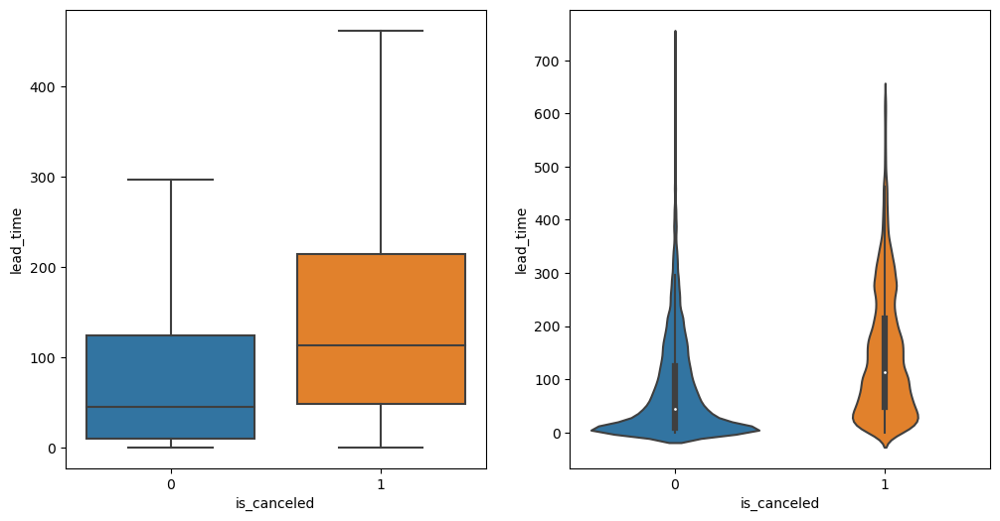

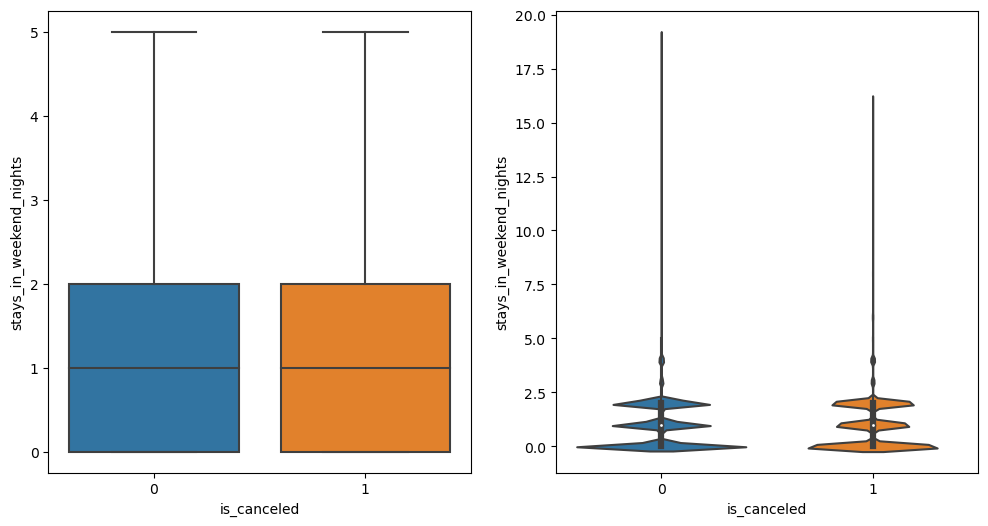

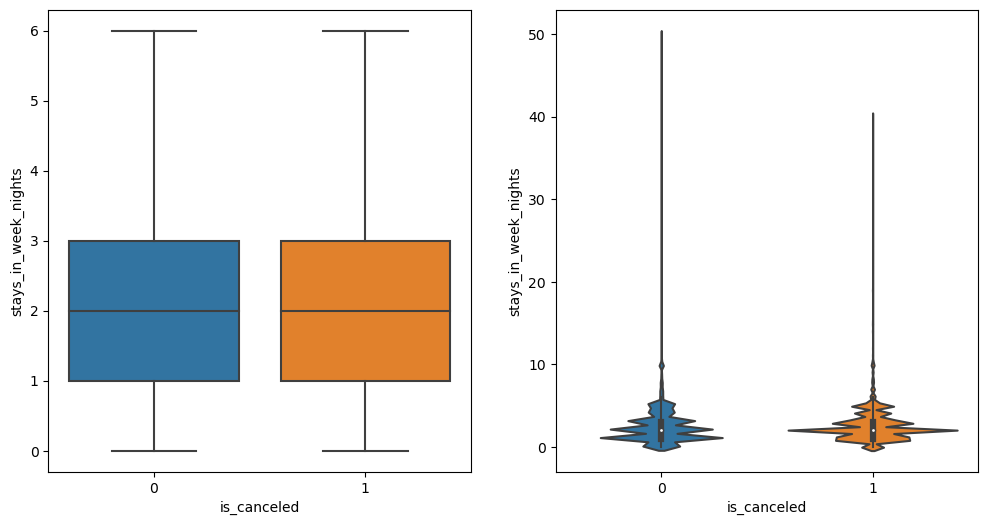

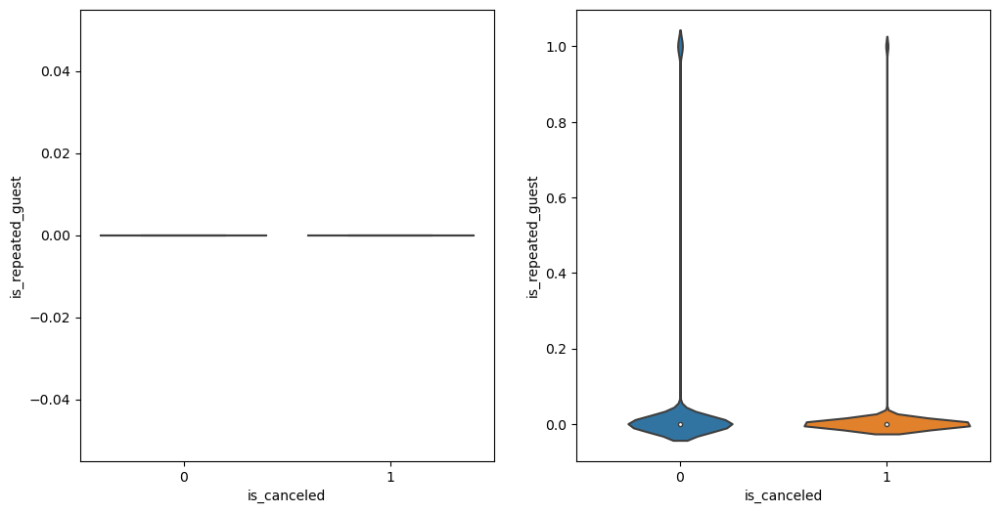

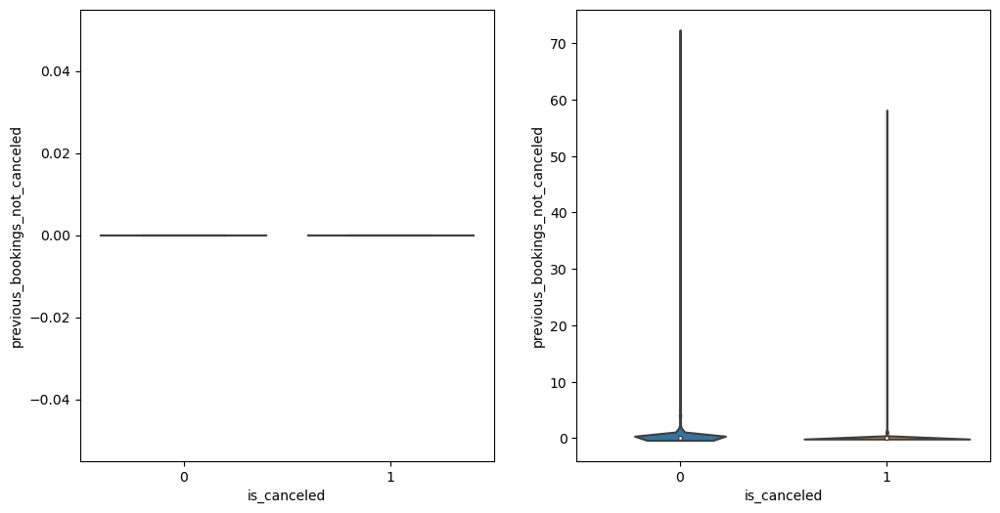

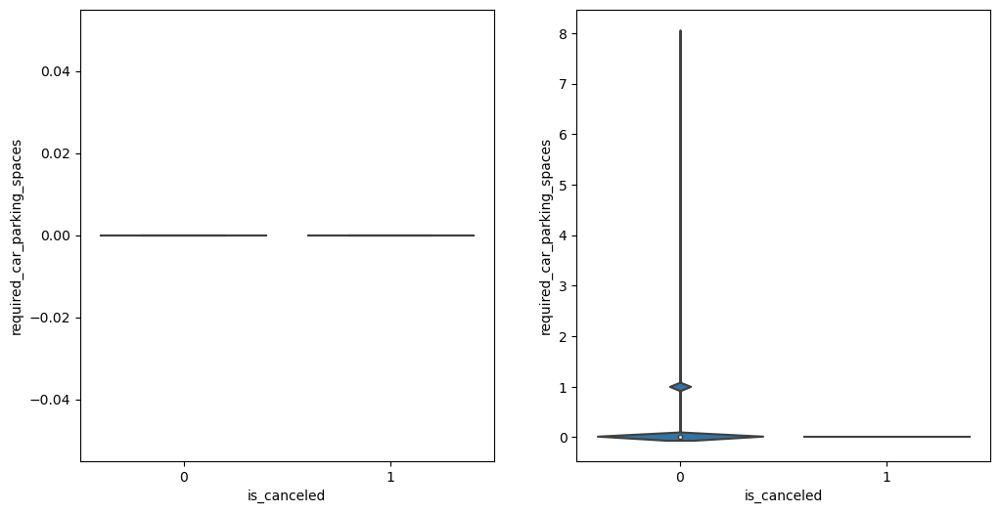

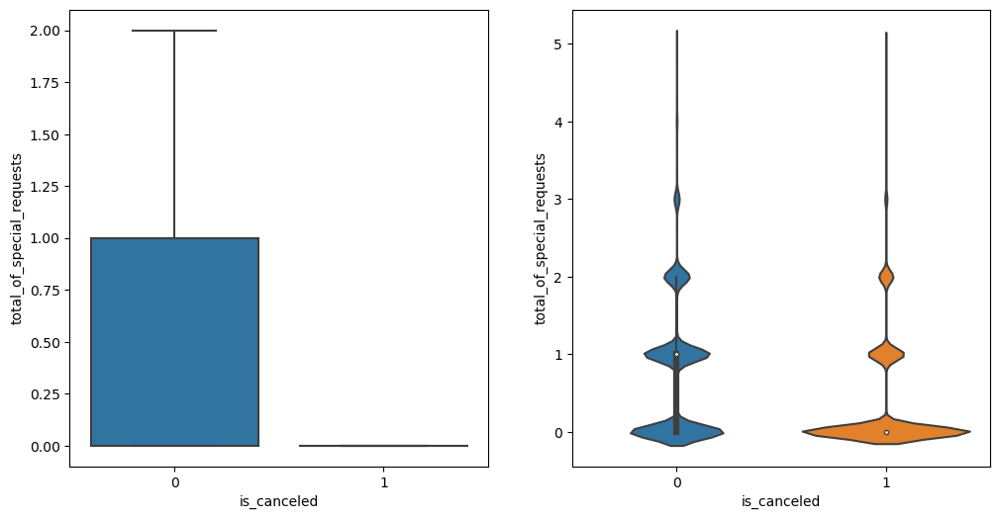

In [26]:
for i in plot_list:
    _, ax = plt.subplots( nrows = 1, ncols = 2, figsize = (12,6))
    sns.boxplot(x = 'is_canceled', y = i, data = df, showfliers = False, ax = ax[0])
    sns.violinplot(x = 'is_canceled', y = i, data = df, showfliers = False, ax = ax[1])
    
    plt.show()


**Observation**

*  few of the features contribute very less to tell whether the customer will cancel the booking. They are -
**stays in wekkend nights**

**stay in week nights**

**repeated guest**

**previous booking canceled or not**

**required car parking spaces**

* The special request feature's limited usefulness for prediction is evident because, despite a difference in median between the groups, around 75% of individuals have zero special requests, making it less informative and challenging for accurate predictions.

* Now, lets discuss about the lead time.

* It is quite significantly different for both of the groups.
* The people more likely to cancel have longer lead time for booking.

## Lead Time

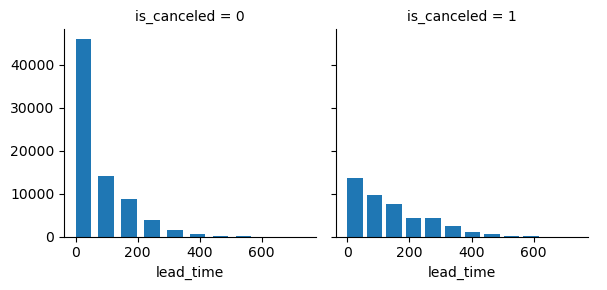

In [46]:
grid = sns.FacetGrid(df, col='is_canceled')
grid.map(plt.hist, 'lead_time', width=50)
grid.add_legend()

**Observation**
* Maximum cancelations occur if the booking is made 60-70 days before the checking date. Longer the lead_time, lower is the cancelation. 

## previous_cancellations

<Axes: xlabel='is_canceled', ylabel='previous_cancellations'>

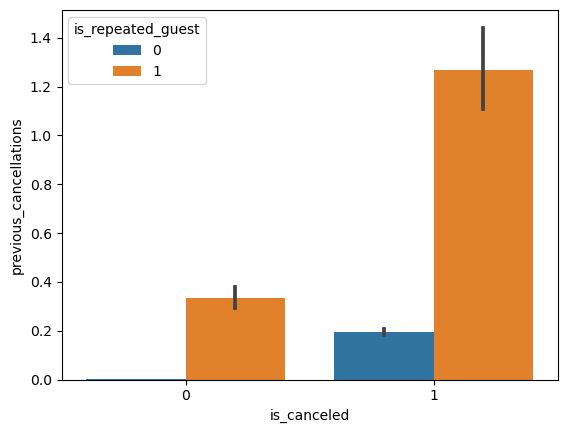

In [48]:
sns.barplot(x = df["is_canceled"], y = df["previous_cancellations"], hue = df["is_repeated_guest"])

**Observation**

* Customers with the history of cancellation tend to cancel more often.
* Interestingly repeated guests tend to cancel more!

## days_in_waiting_list

<Axes: xlabel='is_canceled', ylabel='days_in_waiting_list'>

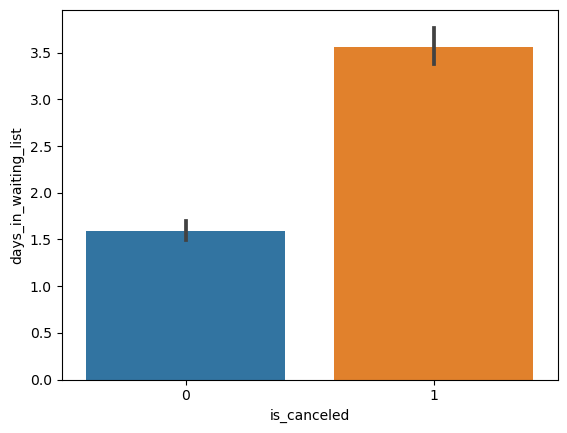

In [49]:
sns.barplot(x = df["is_canceled"], y = df["days_in_waiting_list"])

**Observation**
* More days in waiting list, more chance of cancelling

## Country

In [5]:
country_wise_guests = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
country_wise_guests.columns = ['country', 'No of guests']
country_wise_guests

,country,No of guests
0,PRT,21071
1,GBR,9676
2,FRA,8481
3,ESP,6391
4,DEU,6069
...,...,...
160,BHR,1
161,DJI,1
162,MLI,1
163,NPL,1


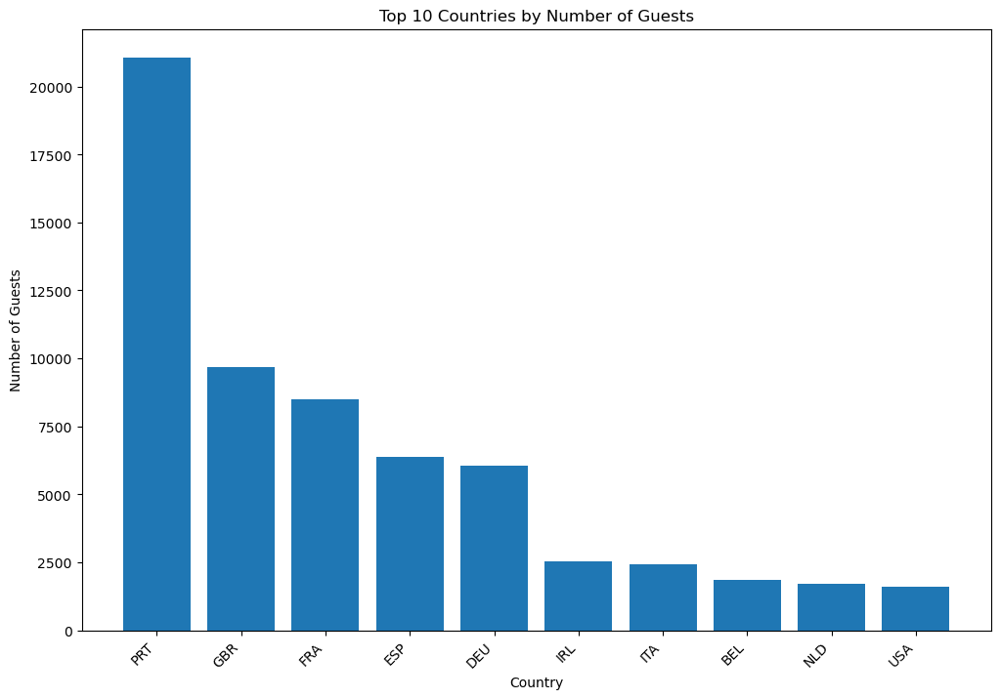

In [6]:
# Assuming df is your DataFrame with the 'country' and 'is_canceled' columns
country_wise_guests = df[df['is_canceled'] == 0]['country'].value_counts().reset_index()
country_wise_guests.columns = ['country', 'No of guests']

# Selecting the top 10 countries
top_10_countries = country_wise_guests.head(10)

# Plotting
plt.figure(figsize=(12, 8))
plt.bar(top_10_countries['country'], top_10_countries['No of guests'])
plt.xlabel('Country')
plt.ylabel('Number of Guests')
plt.title('Top 10 Countries by Number of Guests')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.show()

In [7]:
basemap = folium.Map()
guests_map = px.choropleth(country_wise_guests, locations = country_wise_guests['country'],
                           color = country_wise_guests['No of guests'], hover_name = country_wise_guests['country'])
guests_map.show()

**Observation:**

* People from all over the world are staying in these two hotels. Most guests are from Portugal and other countries in Europe.

In [8]:
data = df[df['is_canceled'] == 0]

px.box(data_frame = data, x = 'reserved_room_type', y = 'adr', color = 'hotel', template = 'plotly_white')


**Observation:**
* The figure shows that the average price per room depends on its type and the standard deviation.

# Hotel

In [11]:
data_resort = df[(df['hotel'] == 'Resort Hotel') & (df['is_canceled'] == 0)]
data_city = df[(df['hotel'] == 'City Hotel') & (df['is_canceled'] == 0)]


In [12]:
data_resort

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,Transient,0.00,0,0,Check-Out,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,Transient,0.00,0,0,Check-Out,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,Transient,75.00,0,0,Check-Out,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,Transient,75.00,0,0,Check-Out,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,Transient,98.00,0,1,Check-Out,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40055,Resort Hotel,0,212,2017,August,35,31,2,8,2,...,Transient,89.75,0,0,Check-Out,2017-09-10,Willie Hamilton,Hamilton_Willie@mail.com,172-436-4780,************5145
40056,Resort Hotel,0,169,2017,August,35,30,2,9,2,...,Transient-Party,202.27,0,1,Check-Out,2017-09-10,Carrie Walker,Carrie_Walker@yahoo.com,141-149-4764,************9816
40057,Resort Hotel,0,204,2017,August,35,29,4,10,2,...,Transient,153.57,0,3,Check-Out,2017-09-12,Joshua Small,Joshua_Small@aol.com,769-653-1129,************7686
40058,Resort Hotel,0,211,2017,August,35,31,4,10,2,...,Contract,112.80,0,1,Check-Out,2017-09-14,Michele Hanson,MHanson@yahoo.com,670-269-4799,************8961


In [13]:
data_city 

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,name,email,phone-number,credit_card
40060,City Hotel,0,6,2015,July,27,1,0,2,1,...,Transient,0.00,0,0,Check-Out,2015-07-03,Elizabeth Ross,Ross.Elizabeth@att.com,313-076-6204,************4378
40066,City Hotel,0,3,2015,July,27,2,0,3,1,...,Transient-Party,58.67,0,0,Check-Out,2015-07-05,Mr. Christopher Davis MD,Mr._M@aol.com,855-025-3048,************4574
40070,City Hotel,0,43,2015,July,27,3,0,2,2,...,Transient-Party,86.00,0,0,Check-Out,2015-07-05,Crystal Pierce,CrystalPierce93@zoho.com,672-975-9750,************1962
40071,City Hotel,0,43,2015,July,27,3,0,2,2,...,Transient-Party,43.00,0,0,Check-Out,2015-07-05,Jeremy Wilcox,Jeremy_Wilcox@hotmail.com,100-100-0744,************4150
40072,City Hotel,0,43,2015,July,27,3,0,2,2,...,Transient-Party,86.00,0,0,Check-Out,2015-07-05,Anna Melendez,Anna_M70@outlook.com,844-417-3641,************2464
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,Transient,96.14,0,0,Check-Out,2017-09-06,Claudia Johnson,Claudia.J@yahoo.com,403-092-5582,************8647
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,Transient,225.43,0,2,Check-Out,2017-09-07,Wesley Aguilar,WAguilar@xfinity.com,238-763-0612,************4333
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,Transient,157.71,0,4,Check-Out,2017-09-07,Mary Morales,Mary_Morales@hotmail.com,395-518-4100,************1821
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,Transient,104.40,0,0,Check-Out,2017-09-07,Caroline Conley MD,MD_Caroline@comcast.net,531-528-1017,************7860


In [14]:
resort_hotel = data_resort.groupby(['arrival_date_month'])['adr'].mean().reset_index()
resort_hotel

,arrival_date_month,adr
0,April,75.867816
1,August,181.205892
2,December,68.322236
3,February,54.147478
4,January,48.708919
5,July,150.122528
6,June,107.921869
7,March,57.012487
8,May,76.657558
9,November,48.681640


In [15]:
city_hotel=data_city.groupby(['arrival_date_month'])['adr'].mean().reset_index()
city_hotel

,arrival_date_month,adr
0,April,111.856824
1,August,118.412083
2,December,87.856764
3,February,86.183025
4,January,82.160634
5,July,115.563810
6,June,117.702075
7,March,90.170722
8,May,120.445842
9,November,86.500456


In [16]:
final_hotel = resort_hotel.merge(city_hotel, on = 'arrival_date_month')
final_hotel.columns = ['month', 'price_for_resort', 'price_for_city_hotel']
final_hotel

,month,price_for_resort,price_for_city_hotel
0,April,75.867816,111.856824
1,August,181.205892,118.412083
2,December,68.322236,87.856764
3,February,54.147478,86.183025
4,January,48.708919,82.160634
5,July,150.122528,115.563810
6,June,107.921869,117.702075
7,March,57.012487,90.170722
8,May,76.657558,120.445842
9,November,48.681640,86.500456


* Now we observe here that month column is not in order, and if we visualize we will get improper conclusions.So, first we have to provide right hierarchy to month column.

# Month

In [17]:
!pip install sort-dataframeby-monthorweek

!pip install sorted-months-weekdays

In [18]:
import sort_dataframeby_monthorweek as sd

def sort_month(df, column_name):
    return sd.Sort_Dataframeby_Month(df, column_name)

In [19]:
final_prices = sort_month(final_hotel, 'month')
final_prices

,month,price_for_resort,price_for_city_hotel
0,January,48.708919,82.160634
1,February,54.147478,86.183025
2,March,57.012487,90.170722
3,April,75.867816,111.856824
4,May,76.657558,120.445842
5,June,107.921869,117.702075
6,July,150.122528,115.563810
7,August,181.205892,118.412083
8,September,96.416860,112.598452
9,October,61.727505,101.745956


In [20]:
plt.figure(figsize = (17, 8))

px.line(final_prices, x = 'month', y = ['price_for_resort','price_for_city_hotel'],
        title = 'Room price per night over the Months', template = 'plotly')

<Figure size 1700x800 with 0 Axes>

**Observation:**

* This plot clearly shows that prices in the Resort Hotel are much higher during the summer and prices of city hotel varies less and is most expensive during Spring (March, April, May )and Autumn(September, October, November) .

In [24]:
resort_guests = data_resort['arrival_date_month'].value_counts().reset_index()
resort_guests.columns=['month','no of guests']
resort_guests


,month,no of guests
0,August,3257
1,July,3137
2,October,2577
3,March,2573
4,April,2550
5,May,2535
6,February,2308
7,September,2102
8,June,2038
9,December,2017


In [25]:
city_guests = data_city['arrival_date_month'].value_counts().reset_index()
city_guests.columns=['month','no of guests']
city_guests

,month,no of guests
0,August,5381
1,July,4782
2,May,4579
3,June,4366
4,October,4337
5,September,4290
6,March,4072
7,April,4015
8,February,3064
9,November,2696


In [26]:
final_guests = resort_guests.merge(city_guests,on='month')
final_guests.columns=['month','no of guests in resort','no of guest in city hotel']
final_guests

,month,no of guests in resort,no of guest in city hotel
0,August,3257,5381
1,July,3137,4782
2,October,2577,4337
3,March,2573,4072
4,April,2550,4015
5,May,2535,4579
6,February,2308,3064
7,September,2102,4290
8,June,2038,4366
9,December,2017,2392


In [27]:
final_guests = sort_month(final_guests,'month')
final_guests

,month,no of guests in resort,no of guest in city hotel
0,January,1868,2254
1,February,2308,3064
2,March,2573,4072
3,April,2550,4015
4,May,2535,4579
5,June,2038,4366
6,July,3137,4782
7,August,3257,5381
8,September,2102,4290
9,October,2577,4337


In [28]:
px.line(final_guests, x = 'month', y = ['no of guests in resort','no of guest in city hotel'],
        title='Total no of guests per Months', template = 'plotly')

**Observations:**

* The City hotel has more guests during spring and autumn, when the prices are also highest, In July and August there are less visitors, although prices are lower.

* Guest numbers for the Resort hotel go down slighty from June to September, which is also when the prices are highest. Both hotels have the fewest guests during the winter.

# customer_type

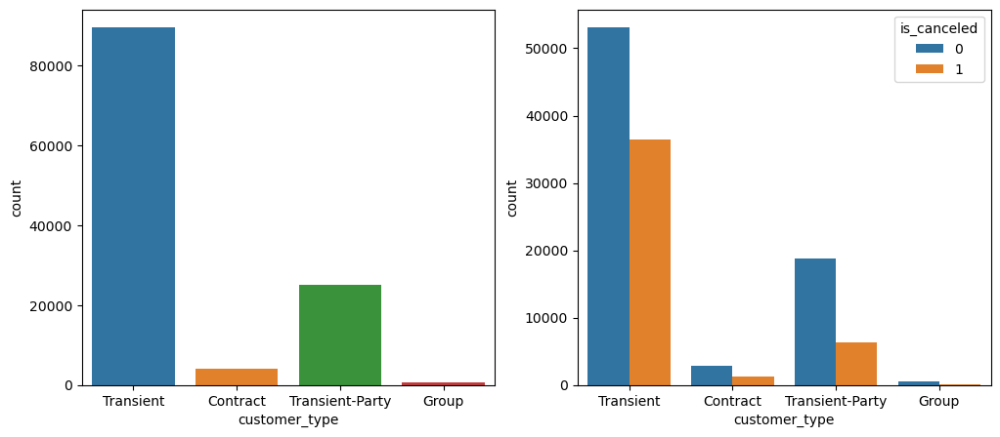

In [47]:
_, ax = plt.subplots( nrows = 1, ncols = 2, figsize = (12,5))
sns.countplot(x = 'customer_type', data = df, ax = ax[0])
sns.countplot(x = 'customer_type', data = df, hue = 'is_canceled', ax = ax[1])
plt.show()

**Observation**
* The plots show the count of bookings by different customer type and their reservation status.
* Transient > Transient-Party > Contract > Group.Same order for no. of bookings and cancellation rate in descending order
* We must definitely consider customer_type in our model.

## deposit_type

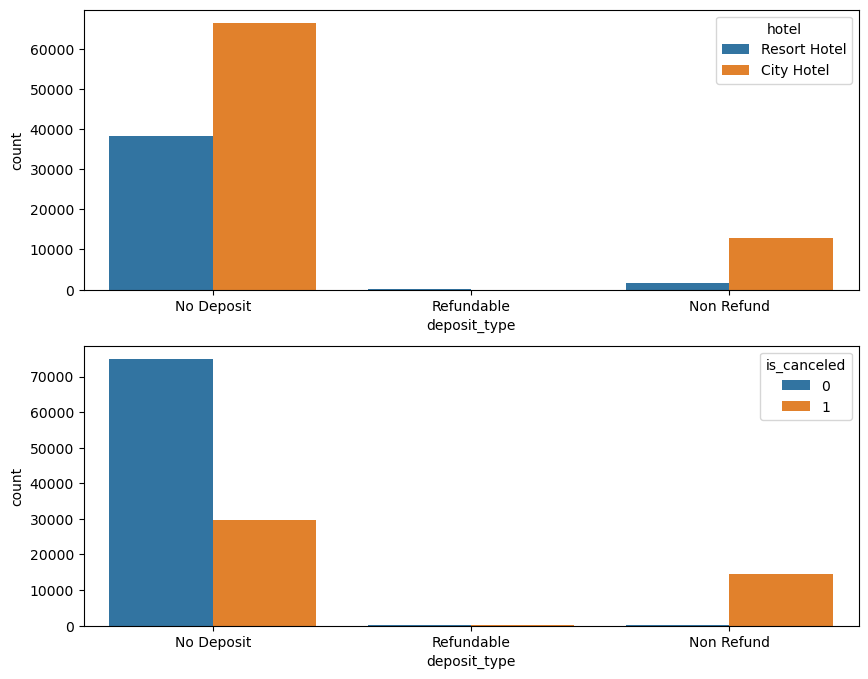

In [50]:
_, ax = plt.subplots( nrows = 2, ncols = 1, figsize = (10,8))
sns.countplot(x = 'deposit_type', data = df, hue = 'hotel', ax = ax[0])
sns.countplot(x = 'deposit_type', data = df, hue = 'is_canceled', ax = ax[1])
plt.show()

**Observation**

* Deposit type has 3 categories - No Deposit, refundable, Non Refund
* Either customers have opted for no deposit or non refundable deposits.
* Maybe refundable deposit type is not offered by the hotels.
* All of the non refund bookings have been cancelled in our dataset. That might prove important feature based on how many such bookings are part of cancelled bookings.
* No hotel has refundable deposit type

### Market Segment

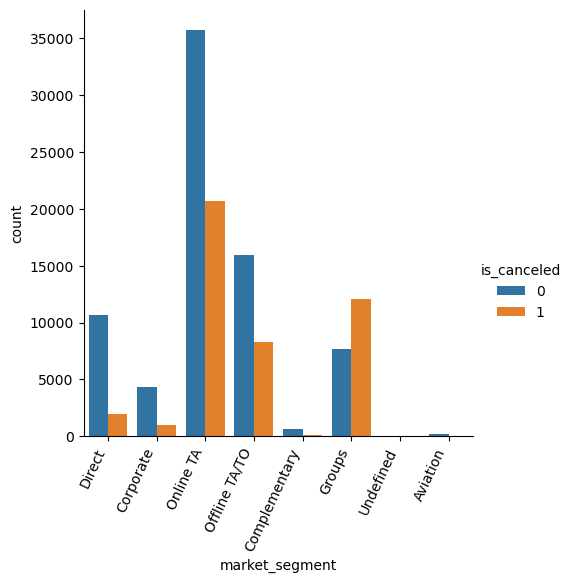

In [51]:
chart = sns.catplot(data=df, x='market_segment', kind='count', hue='is_canceled')
chart.set_xticklabels(rotation=65, horizontalalignment='right')

**Observation**

* Most cancellation are coming from Online Travel Agencies 46% and then followed by Groups which is 18%.

## distribution channel


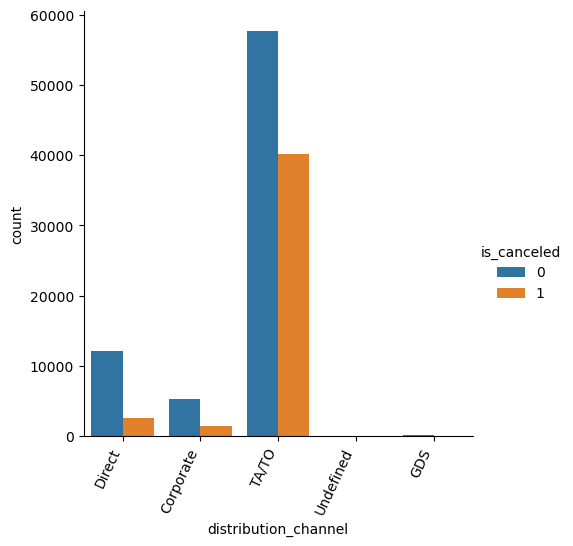

In [67]:
chart = sns.catplot(data=df, x='distribution_channel', kind='count', hue='is_canceled')
chart.set_xticklabels(rotation=65, horizontalalignment='right')

**Observation**

Majority DIstribution channels and Market segment were Travel agencies either offline/online. So better focus more on this

<br/>
<font color="darkblue" size="5">Data Preprocessing</font>


**Data Leakage**:

### Feature Selection and Engineering


* Removing Directly Related Features: We remove features that are directly related to the target variable to prevent data leakage and ensure a fair evaluation of the model.

* Dropping Irrelevant Features: Next, we drop irrelevant features that do not provide any useful information for predicting the target variable.

* Engineering and Dropping High-Cardinality Features: We engineer some high-cardinality features to extract relevant information and then drop all high-cardinality features, including the ones from which we extracted information.

* These activities help in reducing the dimensionality of the dataset, preventing data leakage, and creating new features that may provide additional information for the model.


* Features like reservation_status, reservation_status_date and assigned_room_type are directly related to the target variable 
is_canceled, and including them in the model would result in data leakage. Removing these features is essential to build a 
predictive model that can genuinely forecast cancellations, rather than retrospectively label them.

* reservation_status is a categorical feature that indicates the current status of a reservation. It can have values like 'Canceled', 'Check-Out', and 'No-Show'. This feature is directly related to the target variable is_canceled for the following reasons:

* if the reservation_status is 'Canceled', it implies that is_canceled should be 1.
Similarly, if the reservation_status is 'Check-Out', it implies that the booking was not canceled, and hence is_canceled should be 0.

* Therefore, knowing the reservation_status directly gives us the value of the target variable, leading to data leakage if it is used as a feature in the model. So, it is important to remove this feature to build a model that can actually predict cancellations. Therefore, reservation_status is considered as an irrelevant feature and should be omitted.

## reservation_status

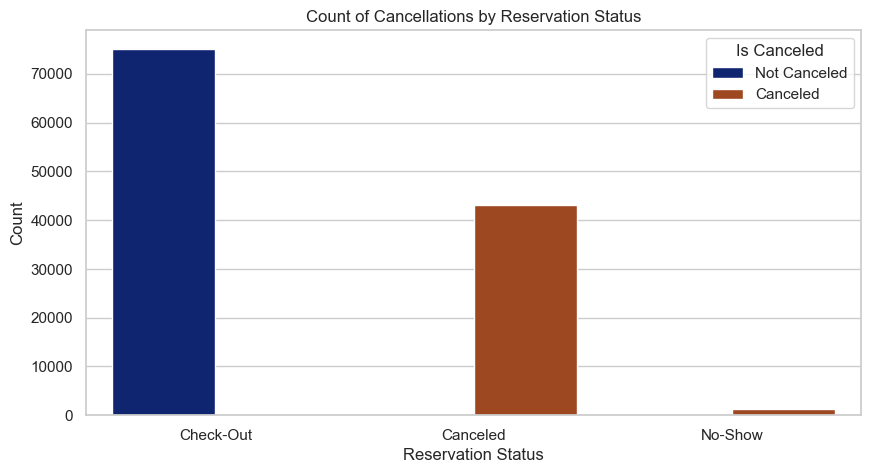

In [70]:
# Bivariate bar plot of 'is_canceled' vs 'reservation_status' with specified colors
plt.figure(figsize=(10, 5))
sns.countplot(x='reservation_status', hue='is_canceled', data=df, palette='dark')
plt.title('Count of Cancellations by Reservation Status')
plt.xlabel('Reservation Status')
plt.ylabel('Count')
plt.legend(title='Is Canceled', labels=['Not Canceled', 'Canceled'])
plt.show()

In [71]:
df.groupby('reservation_status')['is_canceled'].mean()

reservation_status
Canceled     1.0
Check-Out    0.0
No-Show      1.0
Name: is_canceled, dtype: float64

**Observations**

* It is clear from the plot that all the bookings with a reservation_status of "Canceled" or "No-Show" are indeed canceled (is_canceled= 1), and all the bookings with a reservation_status of "Check-Out" are not canceled (is_canceled = 0).

* It appears that reservations marked as "Check-Out" have a 0% cancellation rate, suggesting that all these reservations were completed without cancellations. On the other hand, all reservations marked as "Canceled" or "No-Show" have a 100% cancellation rate

* This confirms that the reservation_status feature is directly related to the is_canceled target variable and including it in the model would cause data leakage. Therefore, it is essential to remove the reservation_status feature before training the model.m

In [72]:
# Drop the `reservation_status` feature
df = df.drop(['reservation_status'], axis=1)

# Cancellation due to the difference in wanted and assigned room type

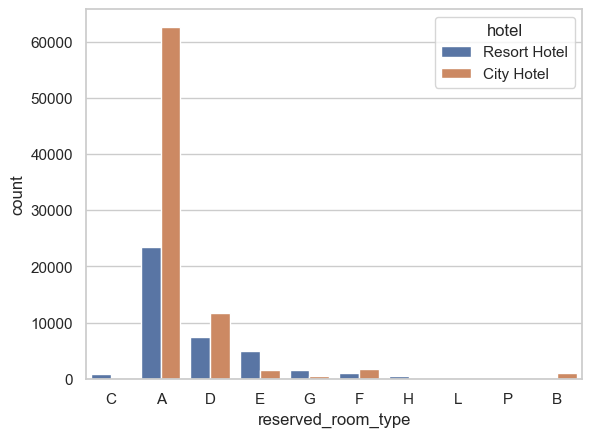

In [73]:
sns.countplot(x = 'reserved_room_type', hue = 'hotel', data = df)
plt.show()

**Observation**
* This figure illustrates that room tyoes are common across the hotels. Both have room types with same names.

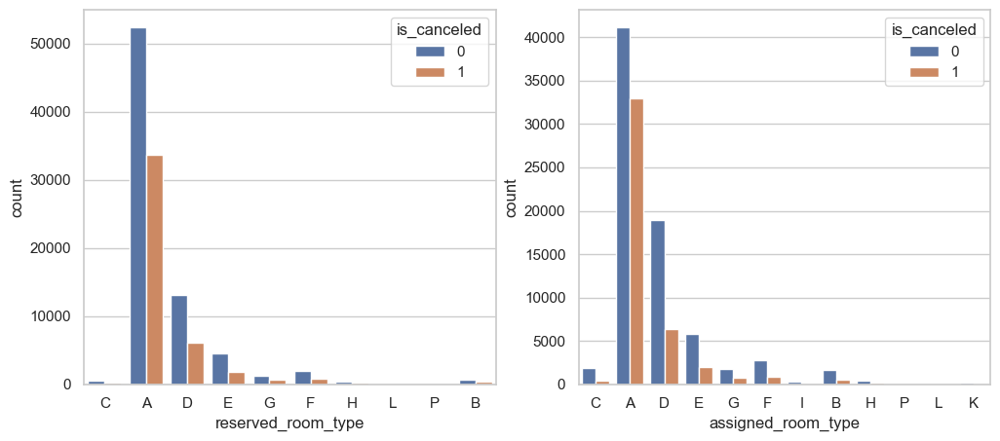

In [74]:
_, ax = plt.subplots( nrows = 1, ncols = 2, figsize = (12,5))
sns.countplot(x = 'reserved_room_type', hue = 'is_canceled', data = df,  ax = ax[0])
sns.countplot(x = 'assigned_room_type', hue = 'is_canceled', data = df,  ax = ax[1])
plt.show()

**Observation**

* Room Types A,D,E have quite high reservation and assignment satus. But as a result, they have high cancellation rate as well. Although one cancellation reason might be the allotment of unwanted room type. Lets check it.

In [75]:
unwanted_room = np.where(df['reserved_room_type'] == df['assigned_room_type'], 'Wanted', 'Unwanted')

In [76]:
df['unwanted_room'] = unwanted_room

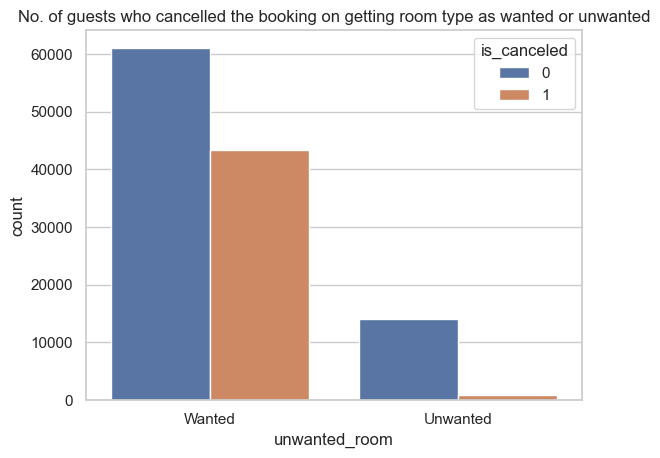

In [77]:
sns.countplot(x = 'unwanted_room', data = df, hue = 'is_canceled')
plt.title("No. of guests who cancelled the booking on getting room type as wanted or unwanted")
plt.show()

**Observation**

* Well, it is highly likely to cancel the reservation if alloted room type is unwanted according to our hypothesis. But here the cancellation rate is very low.

* Although we may completely disprove our hypothesis according to p value statisticsbut here we shall just go with the intutition of seeing the chart Since, it doesnt follow the hypothesis, so should we drop this column now? What if its an important column?

* Well, I guess we should keep the original columns and not worry about this as information is already carried by the previous 2 columns. and they contain more info than this as room types A , D, E had more cancellation rates Let's drop this column.

In [78]:
df.shape

(119390, 36)

In [79]:
df.drop('unwanted_room', axis = 1, inplace = True)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status_date,name,email,phone-number,credit_card
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.0,0,0,2015-07-01,Ernest Barnes,Ernest.Barnes31@outlook.com,669-792-1661,************4322
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.0,0,0,2015-07-01,Andrea Baker,Andrea_Baker94@aol.com,858-637-6955,************9157
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.0,0,0,2015-07-02,Rebecca Parker,Rebecca_Parker@comcast.net,652-885-2745,************3734
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.0,0,0,2015-07-02,Laura Murray,Laura_M@gmail.com,364-656-8427,************5677
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.0,0,1,2015-07-03,Linda Hines,LHines@verizon.com,713-226-5883,************5498


## reservation_status_date

* reservation_status_date is a date feature that indicates the latest date at which the reservation_status was updated. This feature is directly related to the target variable is_canceled for the following reasons:

* If a booking was canceled, the reservation_status_date would be the date on which the booking was canceled, implying that is_canceled should be 1.
* On the other hand, if a booking was not canceled, the reservation_status_date would reflect the date of check-out, implying that is_canceled should be 0.
* Therefore, the reservation_status_date can indirectly give us information about the value of the target variable, leading to data leakage if it is used as a feature in the model.

* The reservation_status_date column is a date variable that represents the date of the last reservation status. Since it is a date, it will likely be in a 'YYYY-MM-DD' format. We can extract some useful information from it:

* Days_Difference: Calculate the difference in days between the reservation_status_date and the arrival_date to create a new feature representing the number of days between the last reservation status and the arrival date.

**Here we making reservation_status_days_difference**

In [80]:
# Convert 'reservation_status_date' to datetime format
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

# Extract Days_Difference from 'reservation_status_date'
df['reservation_status_days_difference'] = (df['reservation_status_date'] - pd.to_datetime(df['arrival_date_year'].astype(str) + '-' + df['arrival_date_month'] + '-' + df['arrival_date_day_of_month'].astype(str))).dt.days


df[['reservation_status_days_difference']].head()

,reservation_status_days_difference
0,0
1,0
2,1
3,1
4,2


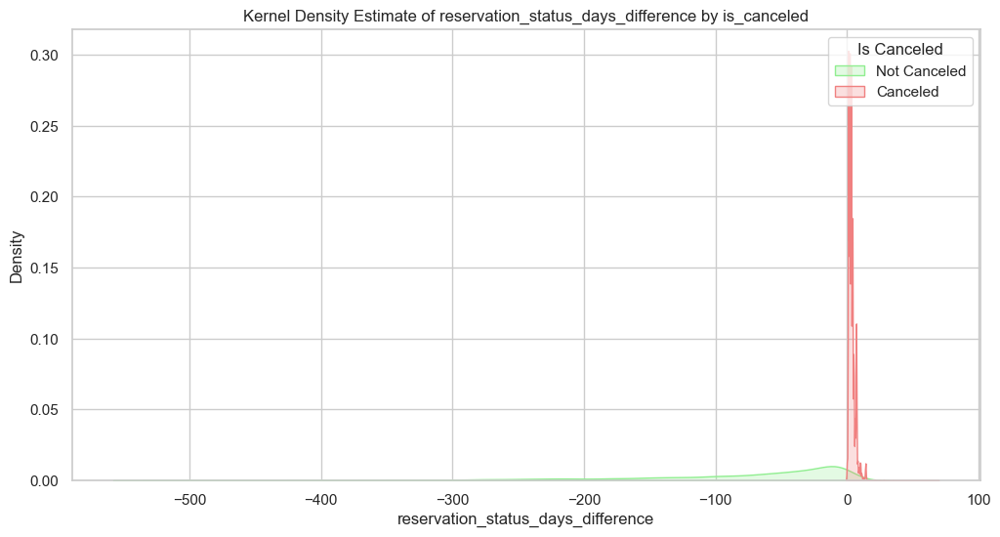

In [81]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x="reservation_status_days_difference", hue="is_canceled", common_norm=False, fill=True, palette=['lightcoral', 'lightgreen'])
plt.title('Kernel Density Estimate of reservation_status_days_difference by is_canceled')
plt.xlabel('reservation_status_days_difference')
plt.ylabel('Density')
plt.legend(title='Is Canceled', labels=['Not Canceled', 'Canceled'])
plt.show()

In [82]:
# For positive values of reservation_status_days_difference
print("Distribution of 'is_canceled' when 'reservation_status_days_difference' is positive:\n")
print(df[df['reservation_status_days_difference'] > 0]['is_canceled'].value_counts())

# For negative values of reservation_status_days_difference
print("\n" + "-"*85)
print("\nDistribution of 'is_canceled' when 'reservation_status_days_difference' is negative:\n")
print(df[df['reservation_status_days_difference'] < 0]['is_canceled'].value_counts())

Distribution of 'is_canceled' when 'reservation_status_days_difference' is positive:

0    74460
Name: is_canceled, dtype: int64

-------------------------------------------------------------------------------------

Distribution of 'is_canceled' when 'reservation_status_days_difference' is negative:

1    42137
Name: is_canceled, dtype: int64


* For positive values of 'reservation_status_days_difference':

* There are 74,460 instances where 'reservation_status_days_difference' is positive.In all these cases, the value of 'is_canceled' is 0, indicating that the bookings were not canceled.For negative values of 'reservation_status_days_difference':

* There are 42,137 instances where 'reservation_status_days_difference' is negative.In all these cases, the value of 'is_canceled' is 1, indicating that the bookings were canceled.

**When 'reservation_status_days_difference' is positive, there were no cancellations (is_canceled = 0).**

**When 'reservation_status_days_difference' is negative, all instances resulted in cancellations (is_canceled = 1).**

* This shows a clear relationship between the reservation_status_days_difference and the is_canceled feature. If a booking is canceled, the reservation status is usually updated before the arrival date. Conversely, if a booking is not canceled, the reservation status is usually updated after the arrival date.

* Therefore, it is advisable to omit both the reservation_status_date and the reservation_status_days_difference features from the model. The latter was derived from the former, and both lead to data leakage, which could result in a model that does not generalize well to new data:

In [83]:
# Drop the 'reservation_status_date' and 'reservation_status_days_difference' columns
df = df.drop(['reservation_status_date', 'reservation_status_days_difference'], axis=1)

## Drop Irrelevant Features

## arrival_date_year'

* The arrival_date_year feature only includes a few years, and if we want to build a model that generalizes well to future data, 
it is advisable not to include features that could bias the model towards specific years. Therefore, it is reasonable to consider arrival_date_year as an irrelevant feature and it should be omitted.

In [84]:
df['arrival_date_year'].value_counts()

2016    56707
2017    40687
2015    21996
Name: arrival_date_year, dtype: int64

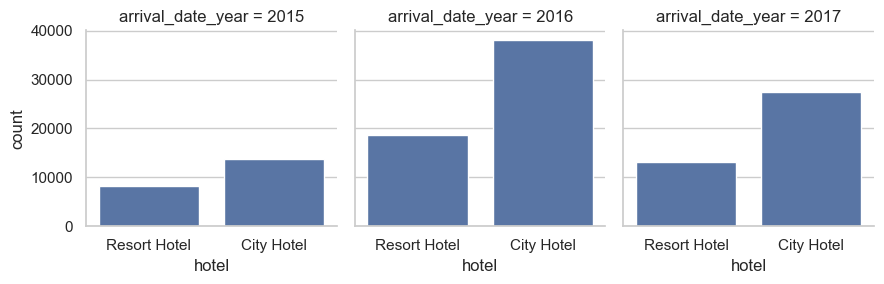

In [85]:
grid = sns.FacetGrid(df, col='arrival_date_year')
grid.map(sns.countplot, 'hotel')

**Observation**
* In all three years city hotels saw more bookings than resort hotels.

In [86]:
# Drop the `arrival_date_year` feature
df = df.drop(['arrival_date_year'], axis=1)

### Meal Type

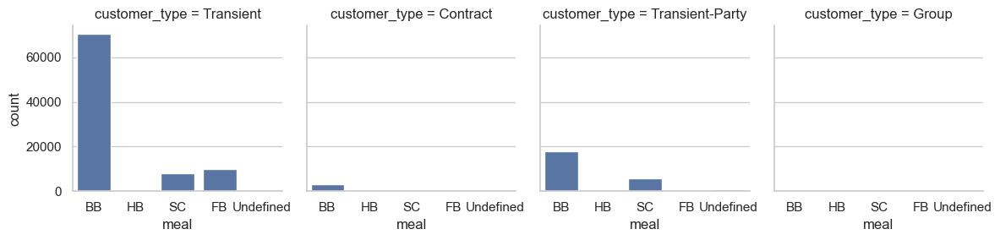

In [87]:
df['meal'].nunique(), df['customer_type'].nunique()
grid = sns.FacetGrid(df, col='customer_type')
grid.map(sns.countplot, 'meal')

**Observation**
* All kinds of customers prefer BB type meals majorly.

## Feature Engineering and Drop High-Cardinality Features

* Based on our findings regarding the features of the dataset from the previous steps, there are a number of categorical features which, due to the large number of categories (high cardinality), probably do not have specific information for the model and should be considered as irrelevant features and should be deleted. However, before that, we will check whether it is possible to extract useful information from the features before droping them:

In [89]:
df.isnull().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              488
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16340
company                           112593
days_in_waiting_

In [90]:
# Create a dataframe with the number of unique categories and missing values for each high-cardinality feature
high_cardinality_features = ['country', 'agent', 'company', 'name', 'email', 'phone-number', 'credit_card']
unique_categories = df[high_cardinality_features].nunique()
missing_values = df[high_cardinality_features].isnull().sum()

# Combine the two series into a single dataframe
high_cardinality_df = pd.DataFrame({'Unique_Categories': unique_categories, 'Missing_Values': missing_values})

high_cardinality_df

,Unique_Categories,Missing_Values
country,177,488
agent,333,16340
company,352,112593
name,81503,0
email,115889,0
phone-number,119390,0
credit_card,9000,0


**country:**

* Description: Country of origin of the guest.

* Action: We will remove this feature for ease of work due to the large number of categories. However, one way to handle this, if needed in future work, is to group the countries into regions (e.g., North America, Europe, Asia, etc.) or to keep only the top N most frequent countries and group the rest into an 'Other' category.

**agent:**

* Description: ID of the travel agent responsible for the booking.

* Action: This feature has several unique categories, and some agents may only appear a few times in the dataset, which could cause overfitting. We could create a new feature representing the number of bookings made by each agent and then drop the original agent feature. However, this new feature may not be very meaningful because the number of bookings made by an agent may not be directly related to the cancellation rate. We will omit this feature.

**company:**

* Description: ID of the company responsible for the booking.

* Action: This feature has a high percentage of missing values and may not be very informative for predicting cancellations, so it may be better to drop it entirely.

**name:**

* Description: Guest's name.

* Action: This feature has many unique categories and is not directly related to the cancellation rate. However, we could create a new feature representing the number of bookings made by each guest (based on the name) and then drop the original name feature. This new feature could be useful because repeat guests may have different cancellation behaviors than first-time guests.

**email:**

* Description: Guest's email address.

* Action: Similar to the name feature, we could create a new feature representing the number of bookings made by each guest (based on the email) and then drop the original email feature. This new feature could capture the same information as the name feature, so it may be redundant to keep both. We will omit this feature.

**phone-number:**

* Description: Guest's phone number.

* Action: This feature is like an identifier because all the rows have different phone-number values, so this feature has no information and we will omit this feature.

**credit_card:**

* Description: Last four digits of the guest's credit card.

* Action: This feature may have many unique categories and is not directly related to the cancellation rate. It may be better to drop this feature entirely.

* In summary, the country, agent, company, email, phone-number, and credit_card features will be omitted from the model due to their high cardinality, high percentage of missing values, or lack of direct relationship with the cancellation rate (is_canceled). The name feature will be engineered to create a new feature representing the number of bookings made by each guest, and then the original name feature will be dropped.

**Here We create new Feature number_of_booking**

In [91]:
# Feature Engineering for 'name' feature
# Create a new feature representing the number of bookings made by each guest (based on the name)
df['number_of_bookings'] = df.groupby('name')['name'].transform('count')

# Drop the original 'name' feature and other high-cardinality features
df = df.drop(['name', 'country', 'agent', 'company', 'email', 'phone-number', 'credit_card'], axis=1)

df[['number_of_bookings']].head()

,number_of_bookings
0,1
1,2
2,3
3,1
4,1


## Handle Missing Values

* I am going to analyze the missing values in each column. If a column has a high percentage of missing values, it may be better to drop the column entirely. For columns with a small percentage of missing values, we can impute the missing values with the mean, median, or mode of the column, or use more advanced imputation techniques like K-nearest neighbors imputation:

In [92]:
# Calculate the missing values percentage in the original dataset
missing_values_percentage = (df.isnull().sum() / len(df)) * 100
missing_values_percentage[missing_values_percentage > 0]

children    0.00335
dtype: float64

**Observations**

* The children feature has a very low percentage of missing values (0.003350%) and is a numerical feature. Given the distribution of values in the children column, the majority of bookings have 0 children, which is a strong mode. Therefore, it would be reasonable to impute the missing values with 0 (the mode of the column). This approach is simple and will not introduce significant bias:

In [93]:
df['children'].value_counts()

0.0     110796
1.0       4861
2.0       3652
3.0         76
10.0         1
Name: children, dtype: int64

In [94]:
# Impute missing values in 'children' column with 0
df['children'] = df['children'].fillna(0)

# Check if there are any missing values left in 'children' column
df['children'].isnull().sum()

0

## Handle Noisy Data


In [95]:

# Analyze noisy data
noisy_data = {
    'adr':      df[df['adr'] < 0],
    'adults':   df[df['adults'] == 0],
    'children': df[df['children'] == 10],
    'babies':   df[df['babies'] == 10],
}

noisy_data_count = {key: len(value) for key, value in noisy_data.items()}
noisy_data_count

{'adr': 1, 'adults': 403, 'children': 1, 'babies': 1}

**Observations**
* We have identified some noisy data in the following features:

* adr: There is 1 booking with a negative Average Daily Rate (ADR), which doesn't make sense and indicates a potential error or special case.

* adults: There are 403 bookings with 0 adults, which could be a data entry error unless there are legitimate cases where only children or babies book a room.

* children: There is 1 booking with 10 children, which seems unusually high for a single booking and could be a potential outlier or data entry error.

* babies: There is 1 booking with 10 babies, which seems unusually high for a single booking and could be a potential outlier or data entry error.

In [96]:
# Replace negative adr with median of adr column
df.loc[df['adr'] < 0, 'adr'] = df['adr'].median()

# Remove rows with 0 adults
df = df[df['adults'] != 0]

# Remove rows with 10 children or 10 babies
df = df[df['children'] != 10]
df = df[df['babies'] != 10]

# Reset the index
df.reset_index(drop=True, inplace=True)

# Check if the noisy data has been handled
noisy_data_handled = {
    'adr': df[df['adr'] < 0],
    'adults': df[df['adults'] == 0],
    'children': df[df['children'] == 10],
    'babies': df[df['babies'] == 10],
}

noisy_data_handled_count = {key: len(value) for key, value in noisy_data_handled.items()}
noisy_data_handled_count

{'adr': 0, 'adults': 0, 'children': 0, 'babies': 0}

## Check Imbalanced Data

,Labels,Count
0,not canceled,74871
1,canceled,44114


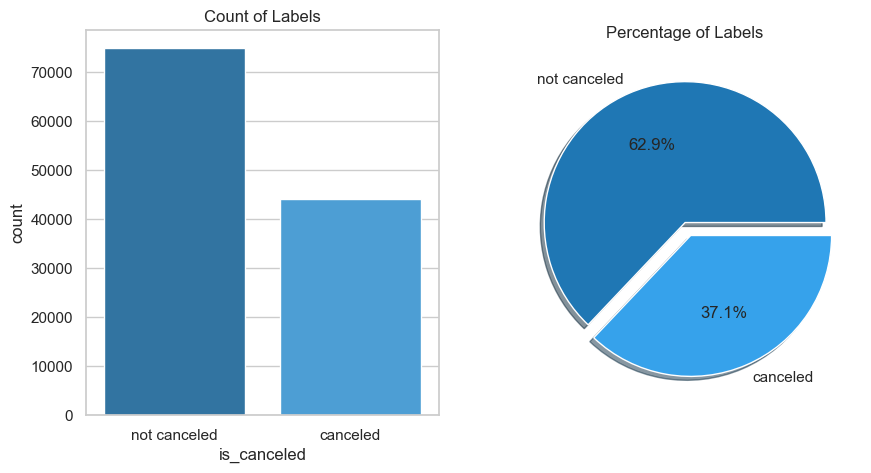

In [97]:
plt.figure(figsize=(10, 5))
colors = ['#1F77B4', '#36A2EB']
labels = ['not canceled', 'canceled']

# count plot (counts) :
plt.subplot(1, 2, 1)
sns.countplot(x='is_canceled', data=df, palette=  colors)
plt.title('Count of Labels')
plt.xticks([0, 1], labels)

# value counts in is_canceled :
count_0 = df[df['is_canceled'] == 0]['is_canceled'].count()
count_1 = df[df['is_canceled'] == 1]['is_canceled'].count()
total_count = count_0 + count_1

# percentage of each value:
percentage_0 = (count_0 / total_count) * 100
percentage_1 = (count_1 / total_count) * 100

# pie chart (percentage):
plt.subplot(1, 2, 2)
plt.pie([percentage_0, percentage_1], labels=labels, autopct='%1.1f%%', colors=colors, shadow=True, explode = [0, 0.1])
plt.title('Percentage of Labels');

value_counts = df['is_canceled'].value_counts()
label_names = {0: 'not canceled', 1: 'canceled'}
value_counts_df = pd.DataFrame({'Labels': value_counts.index.map(label_names), 'Count': value_counts.values})
value_counts_df

**Observation**
* The bar plot shows the percentage of cancellations and non-cancellations in the dataset. Approximately 37.1% of the bookings were canceled, and 62.92% were not canceled. This indicates that there is some imbalance in the target variable, but it is not highly imbalanced. Generally, a dataset is considered highly imbalanced if one class represents over 80-90% of the data. In this case, the minority class (canceled) is still well-represented, so it may not be necessary to apply any resampling techniques (e.g., oversampling, undersampling) to balance the classes. However, it is always good to try different approaches and evaluate the model's performance to decide the best approach.

## Hotel Distribution

In [98]:
df['hotel'].value_counts()

City Hotel      78939
Resort Hotel    40046
Name: hotel, dtype: int64

In [99]:
hotel_cancel = pd.crosstab(df['hotel'], df['is_canceled'], margins=True)
hotel_cancel

is_canceled,0,1,All
hotel,,,
City Hotel,45944,32995,78939
Resort Hotel,28927,11119,40046
All,74871,44114,118985


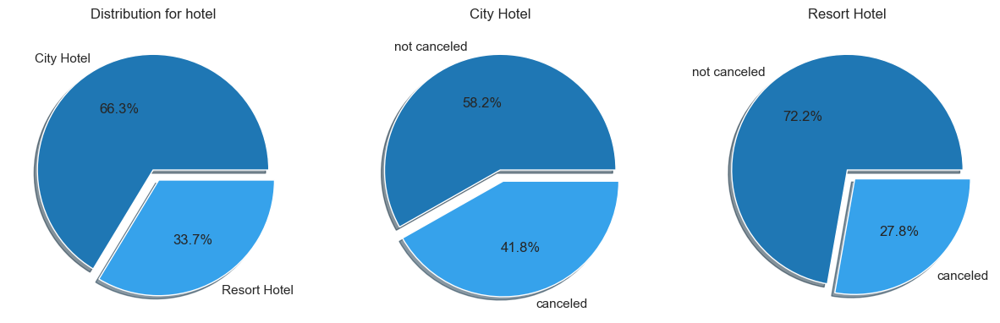

In [100]:
plt.figure(figsize=(15, 5))

# plot1 : hotel distribution :
plt.subplot(1, 3, 1)
plt.title('Distribution for hotel')
city_hotel = df[df['hotel'] == 'City Hotel']['hotel'].count()
resort_hotel = df[df['hotel'] == 'Resort Hotel']['hotel'].count()
total_hotel = count_0 + count_1
percent_city = city_hotel/total_hotel * 100
percent_resort = resort_hotel/total_hotel * 100
plt.pie([percent_city,percent_resort],labels=['City Hotel','Resort Hotel'], autopct='%1.1f%%', colors=colors, shadow=True, explode = [0, 0.1] )

percent_city

# plot2 : City Hotel canceled distribution :
plt.subplot(1, 3, 2)
city_percent_0 = hotel_cancel.iloc[0,0]/hotel_cancel.iloc[0,2]*100
city_percent_1 = hotel_cancel.iloc[0,1]/hotel_cancel.iloc[0,2]*100
plt.title('City Hotel')
plt.pie([city_percent_0,city_percent_1],labels=labels, autopct='%1.1f%%', colors=colors, shadow=True, explode = [0, 0.1] )

# # plot3 : Resort Hotel canceled distribution :
plt.subplot(1, 3, 3)
Resort_percent_0 = hotel_cancel.iloc[1,0]/hotel_cancel.iloc[1,2]*100
Resort_percent_1 = hotel_cancel.iloc[1,1]/hotel_cancel.iloc[1,2]*100
plt.title('Resort Hotel')
plt.pie([Resort_percent_0,Resort_percent_1],labels=labels, autopct='%1.1f%%', colors=colors, shadow=True, explode = [0, 0.1] );

**Observation**
* About 66.3% of the data is related to City hotels, out of which 41.8% of the reservations have been canceled. Additionally, 33.7% of the data corresponds to Resort hotels, with 27.8% of them being canceled.

## Arrival date month

In [101]:
month_cancel = pd.crosstab(df['arrival_date_month'], df['is_canceled'], margins=True ,)
month_cancel['Booked%'] = (month_cancel['All']/len(df)*100).round(2)   #percentage of reservation per month
month_cancel['TotalCancel%'] = (month_cancel[1]/len(df)*100).round(2)  # canceled bookings in total 
month_cancel['MonthCancel%'] = (month_cancel[1]/month_cancel['All']*100).round(2)  # canceled per month  

# ======================== Sort By Month ==============================
# make arrival_date_month columns and change index to numbers
month_cancel['arrival_date_month'] = month_cancel.index
month_cancel = month_cancel.reset_index(drop=True)
# define month order
month_order = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December", "All"]
# sort by month
month_cancel["arrival_date_month"] = pd.Categorical(month_cancel["arrival_date_month"], categories=month_order, ordered=True)
month_cancel = month_cancel.sort_values("arrival_date_month")
# replce index again
month_cancel = month_cancel.set_index(month_cancel["arrival_date_month"])
month_cancel = month_cancel.set_index("arrival_date_month", drop=True)
month_cancel

is_canceled,0,1,All,Booked%,TotalCancel%,MonthCancel%
arrival_date_month,,,,,,
January,4100,1802,5902,4.96,1.51,30.53
February,5347,2687,8034,6.75,2.26,33.45
March,6614,3137,9751,8.20,2.64,32.17
April,6547,4510,11057,9.29,3.79,40.79
May,7095,4669,11764,9.89,3.92,39.69
June,6386,4531,10917,9.18,3.81,41.50
July,7884,4726,12610,10.60,3.97,37.48
August,8603,5226,13829,11.62,4.39,37.79
September,6381,4108,10489,8.82,3.45,39.16


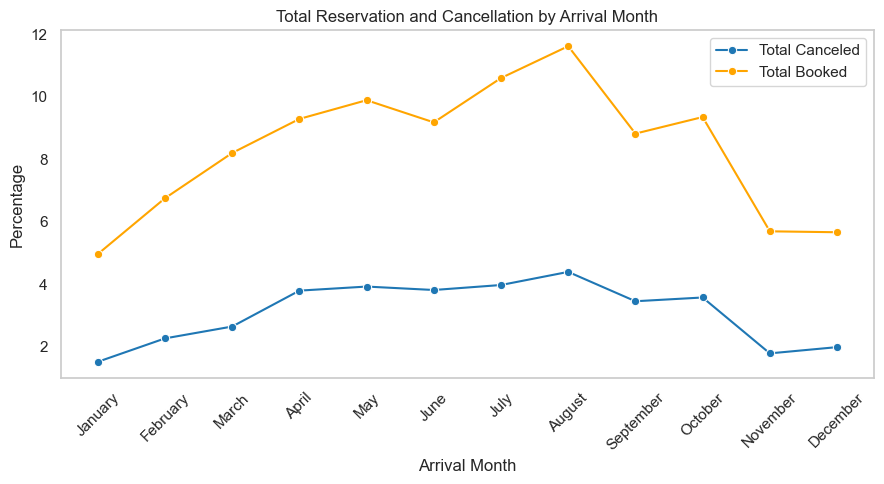

In [102]:
plt.figure(figsize=(9, 5))

sns.lineplot(data=month_cancel.iloc[:12],
             x="arrival_date_month",
             y="TotalCancel%", 
             marker="o",
             label="Total Canceled"
             ,color=colors[0])

sns.lineplot(data=month_cancel.iloc[:12],
             x="arrival_date_month",
             y="Booked%",
             marker="o",
             label="Total Booked",
             color='orange')

plt.title("Total Reservation and Cancellation by Arrival Month")
plt.xlabel("Arrival Month")
plt.ylabel("Percentage")
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout();

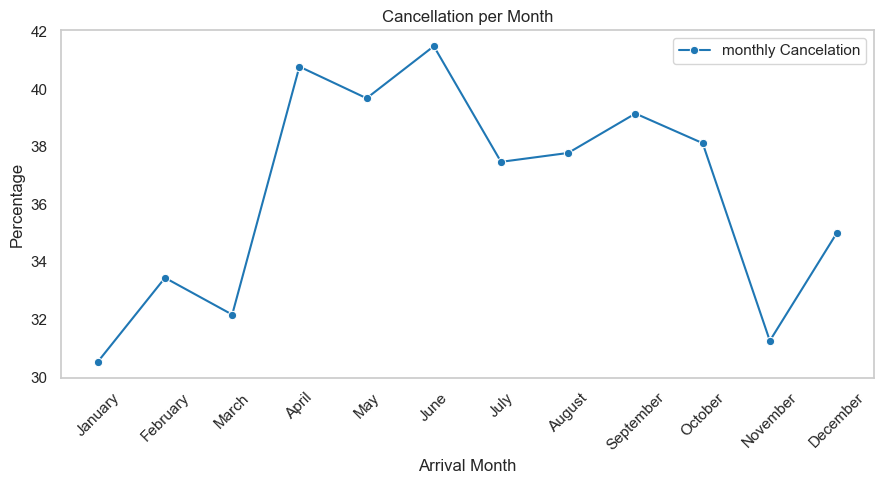

In [103]:
plt.figure(figsize=(9, 5))

sns.lineplot(data=month_cancel.iloc[:12],
             x="arrival_date_month",
             y="MonthCancel%",
             marker="o",
             label="monthly Cancelation",
             color=colors[0])
plt.title("Cancellation per Month")
plt.xlabel("Arrival Month")
plt.ylabel("Percentage")
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout();

**Observation**

As seen in the tables and charts below,the highest number of bookings, totaling 13,861 and accounting for approximately 11.6% of all bookings, was recorded for August. Conversely, the lowest number of bookings, amounting to 5,921 and representing about 4.97% of total bookings, occurred in January. This trend could be attributed to multiple factors. August may serve as a peak vacation month, prompting heightened travel activity and an increased demand for hotel reservations. In contrast, January often experiences reduced travel post-holiday season, resulting in fewer bookings. Similarly, the highest cancellation rate of 4.39% is attributed to the month of August, while the lowest rate of 1.51% belongs to January. The surge in August bookings possibly indicates higher demand during this period, potentially leading to more cancellations. Conversely, the decline in January bookings might signify decreased demand, contributing to a higher proportion of cancellations. January's lower cancellation rate could be attributed to travelers solidifying their plans post-holiday season, resulting in fewer alterations or cancellations.

In [107]:
cancel_corr = df.corr()["is_canceled"]
cancel_corr.abs().sort_values(ascending=False)[1:]

deposit_type_Non Refund           0.482040
lead_time                         0.292988
total_of_special_requests         0.235267
market_segment_Groups             0.222255
required_car_parking_spaces       0.195864
distribution_channel_TA/TO        0.176111
market_segment_Direct             0.154466
distribution_channel_Direct       0.151660
booking_changes                   0.144892
hotel_Resort Hotel                0.137283
customer_type_Transient           0.133253
assigned_room_type_D              0.128443
customer_type_Transient-Party     0.124282
previous_cancellations            0.110223
is_repeated_guest                 0.083797
market_segment_Corporate          0.081720
assigned_room_type_E              0.065329
adults                            0.058891
previous_bookings_not_canceled    0.057414
days_in_waiting_list              0.054358
assigned_room_type_C              0.053885
reserved_room_type_D              0.047776
adr                               0.046440
assigned_ro

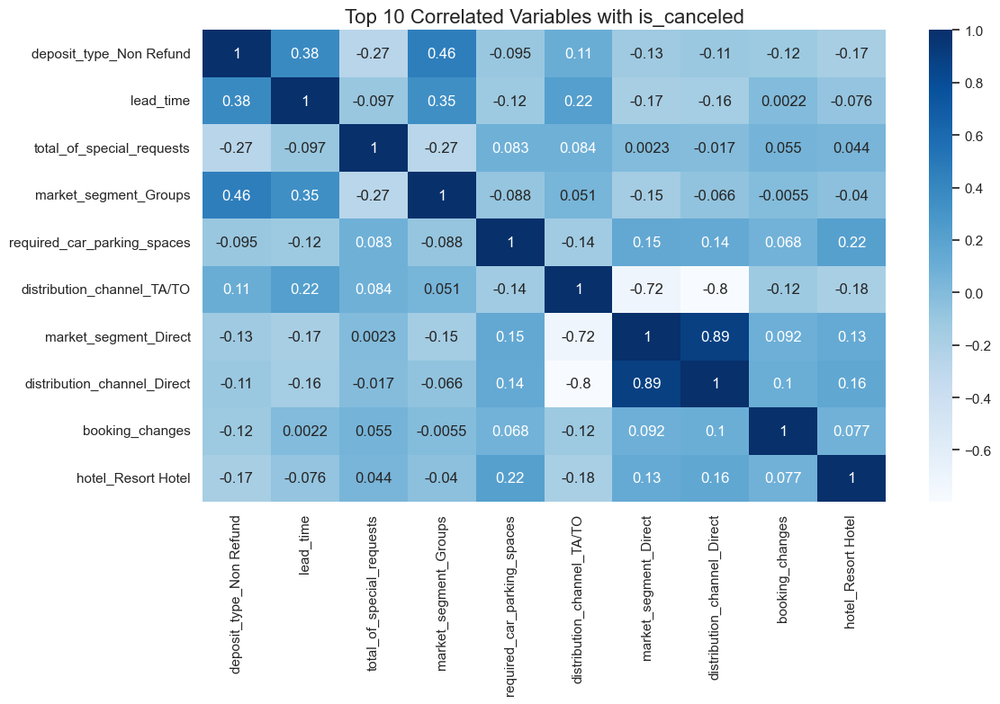

In [114]:

# Assuming your DataFrame is named df and you have the cancel_corr series
cancel_corr = df.corr()["is_canceled"]
cancel_corr_abs_sorted = cancel_corr.abs().sort_values(ascending=False)[1:]

# Select the top N correlated variables
top_n = 10  # You can adjust this number based on your preference
selected_vars = df[cancel_corr_abs_sorted[:top_n].index]

# Set the style for the plot
sns.set(style="white")

# Create a figure and axis
plt.figure(figsize=(12, 8))

# Create a heatmap
sns.heatmap(selected_vars.corr(), cmap="Blues", annot=True, cbar=True)

# Set the title and adjust layout
plt.title(f'Top {top_n} Correlated Variables with is_canceled', fontsize=16)
plt.tight_layout()

# Show the plot
plt.show()

**Strong Positive Correlation:**

Non-refundable deposits (deposit_type_Non Refund) and lead time (lead_time) have the highest positive impact on cancellations.


**Moderate Positive Correlation:**

Variables like market_segment_Groups and required_car_parking_spaces show moderate positive correlations with cancellations.

**Other Positive Correlations:**

Several features, including booking-related metrics and hotel/customer types, exhibit weak positive correlations with cancellations.

**Weak Negative Correlation:**

Some variables like stays_in_week_nights have a very weak negative correlation, suggesting a slight tendency for lower cancellations with higher values.

<br/>
<font color="darkblue" size="5">Model building</font>



### Encoding

In [104]:
# Convert 'arrival_date_month' to numerical values
months = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df['arrival_date_month'] = df['arrival_date_month'].apply(lambda x: months.index(x) + 1)

# One-hot encode the specified columns
one_hot_cols = ['hotel', 'meal', 'market_segment', 'distribution_channel','assigned_room_type','reserved_room_type', 'deposit_type', 'customer_type']
df = pd.get_dummies(df, columns=one_hot_cols, drop_first=True)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118985 entries, 0 to 118984
Data columns (total 58 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   is_canceled                     118985 non-null  int64  
 1   lead_time                       118985 non-null  int64  
 2   arrival_date_month              118985 non-null  int64  
 3   arrival_date_week_number        118985 non-null  int64  
 4   arrival_date_day_of_month       118985 non-null  int64  
 5   stays_in_weekend_nights         118985 non-null  int64  
 6   stays_in_week_nights            118985 non-null  int64  
 7   adults                          118985 non-null  int64  
 8   children                        118985 non-null  float64
 9   babies                          118985 non-null  int64  
 10  is_repeated_guest               118985 non-null  int64  
 11  previous_cancellations          118985 non-null  int64  
 12  previous_booking

In [115]:
# Splitting data into train, validation, and test sets
X = df.drop('is_canceled', axis=1)
y = df['is_canceled']

In [116]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # 80% training and 20% test

In [117]:
print(X_test.shape)
print(X_train.shape)
print(y_test.shape)
print(y_train.shape)

(23797, 57)
(95188, 57)
(23797,)
(95188,)


In [118]:
print(f"X_train.shape-->{X_train.shape}")
print(f"X_test.shape-->{X_test.shape}")

X_train.shape-->(95188, 57)
X_test.shape-->(23797, 57)


In [132]:
# Function to create a confusion matrix
def make_confusion_matrix(model, X_test, y_actual):
    """
    Creates a confusion matrix to visualize the performance of a classification model.
    
    Parameters:
    - model: The trained classification model
    - X_test: The feature matrix of the test set
    - y_actual: The actual labels of the test set
    
    Returns:
    - A pandas DataFrame representing the confusion matrix.
    """
    y_predict = model.predict(X_test)
    cm = confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index=["Actual - No", "Actual - Yes"], columns=["Predicted No", "Predicted Yes"])
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    sns.heatmap(df_cm, annot=labels, fmt='', cmap='Blues', annot_kws={"size": 16})
    plt.xlabel("Predicted Label", fontsize=14)
    plt.ylabel("True Label", fontsize=14)
    plt.title("Confusion Matrix", fontsize=16)
    plt.show()



<br/>
<font color="darkblue" size="5">Logistic Regression</font>


Evaluation Metrics:
Accuracy - Training Set: 0.7875467495902845
Accuracy - Test Set: 0.7867378240954742

Precision - Training Set: 0.7624392461274869
Precision - Test Set: 0.7648614784908813

Recall - Training Set: 0.6188624623942782
Recall - Test Set: 0.6186936936936936

F1 Score - Training Set: 0.6831889461563768
F1 Score - Test Set: 0.6840565274232708



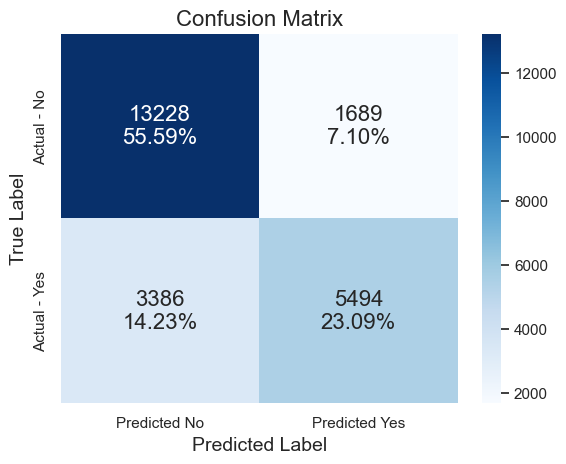

In [136]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
# Initialize and fit a logistic regression model using scikit-learn
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Make predictions on the training set and test set
y_train_pred = log_reg.predict(X_train)
y_test_pred = log_reg.predict(X_test)

# Calculate and print evaluation metrics for the model's performance
# - Accuracy
# - Precision
# - Recall
# - F1 Score
# These metrics are essential for assessing the classification model's effectiveness

accuracy_train = accuracy_score(y_train, y_train_pred)
accuracy_test = accuracy_score(y_test, y_test_pred)

precision_train = precision_score(y_train, y_train_pred)
precision_test = precision_score(y_test, y_test_pred)

recall_train = recall_score(y_train, y_train_pred)
recall_test = recall_score(y_test, y_test_pred)

f1_train = f1_score(y_train, y_train_pred)
f1_test = f1_score(y_test, y_test_pred)

print("Evaluation Metrics:")
print("Accuracy - Training Set:", accuracy_train)
print("Accuracy - Test Set:", accuracy_test)
print()
print("Precision - Training Set:", precision_train)
print("Precision - Test Set:", precision_test)
print()
print("Recall - Training Set:", recall_train)
print("Recall - Test Set:", recall_test)
print()
print("F1 Score - Training Set:", f1_train)
print("F1 Score - Test Set:", f1_test)
print()

# Now you can call make_confusion_matrix
make_confusion_matrix(log_reg, X_test, y_test)

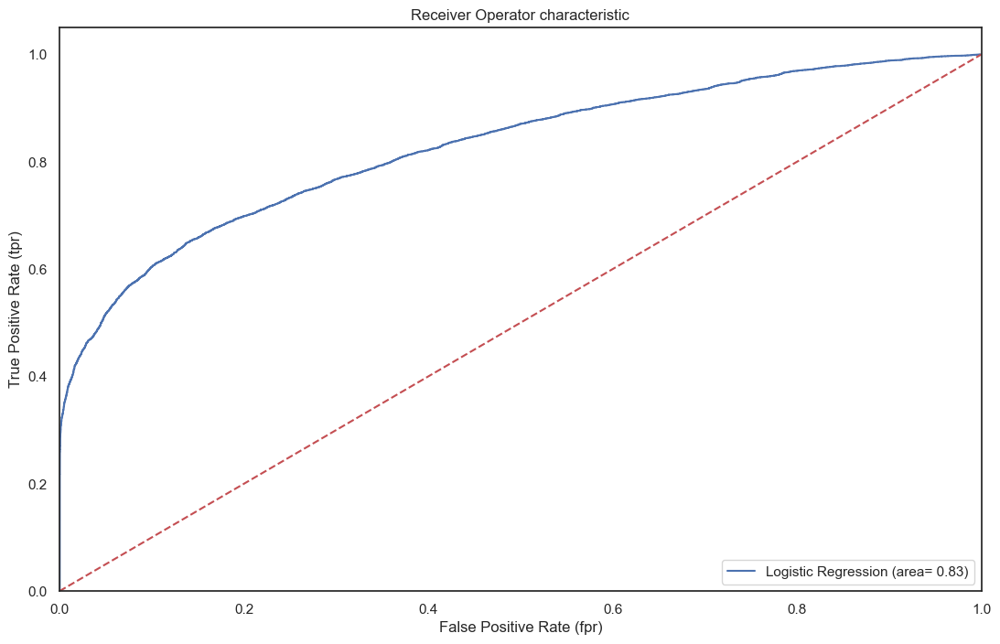

In [137]:
# Plot ROC_AUC_Curve
logit_roc_auc = roc_auc_score(y_test, log_reg.predict_proba(X_test)[:,1])
fpr, tpr, thresholds = roc_curve(y_test, log_reg.predict_proba(X_test)[:,1])
plt.figure(figsize=(13,8))
plt.plot(fpr, tpr, label='Logistic Regression (area= %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1], 'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (fpr)')
plt.ylabel('True Positive Rate (tpr)')
plt.title('Receiver Operator characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

In [138]:
# Predict probabilities on the training set
train_pred_prob = log_reg.predict_proba(X_train)[:, 1]
train_pred_prob

array([0.39980701, 0.08512282, 0.88427441, ..., 0.30771196, 0.04478258,
       0.29280237])

In [139]:
import pandas as pd
import numpy as np

Cutoff_Prob = thresholds
cutoff_data = pd.DataFrame()

# Iterate over each cutoff probability
for cutoff in Cutoff_Prob:
    # Predict binary labels based on the probability cutoff
    pred_y = (train_pred_prob > cutoff).astype("int64")

    # Calculate True Positives (TP), False Negatives (FN), True Negatives (TN), False Positives (FP)
    TP = np.logical_and((pred_y == 1), (y_train== 1)).sum()
    FN = np.logical_and((pred_y == 0), (y_train == 1)).sum()
    TN = np.logical_and((pred_y == 0), (y_train == 0)).sum()
    FP = np.logical_and((pred_y == 1), (y_train == 0)).sum()

    # Calculate total Positive (P) and Negative (N) instances
    P = TP + FN
    N = TN + FP

    # Create a dictionary with the calculated values
    temp_data = {
        "Cutoff_Prob": cutoff,
        "TP": TP,
        "FN": FN,
        "TN": TN,
        "FP": FP,
        "P": P,
        "N": N
    }

    # Append the dictionary as a new row to the cutoff_data DataFrame
    cutoff_data = cutoff_data.append(temp_data, ignore_index=True)

In [140]:
# Sensitivity (Sn)
cutoff_data['Sn'] = cutoff_data["TP"] / cutoff_data["P"]

# Specificity (Sp)
cutoff_data['Sp'] = cutoff_data["TN"] / cutoff_data["N"]

# Distance
cutoff_data['Dist'] = ((1 - cutoff_data["Sn"])**2 + (1 - cutoff_data["Sp"])**2)**0.5

# Kolmogorov-Smirnov (KS)
cutoff_data['KS'] = ((cutoff_data["TP"] / cutoff_data["P"]) - (cutoff_data["FP"] / cutoff_data["N"])).abs()

# Recall (Re)
cutoff_data['Re'] = cutoff_data["TP"] / cutoff_data["P"]

# Precision (Pr)
cutoff_data['Pr'] = cutoff_data["TP"] / (cutoff_data["TP"] + cutoff_data["FP"])

# True Positive Rate (tpr)
cutoff_data['tpr'] = cutoff_data["Re"]

# False Positive Rate (fpr)
cutoff_data['fpr'] = 1 - cutoff_data["Sp"]

# F1 Score
cutoff_data['f1'] = 2 * (cutoff_data["Pr"] * cutoff_data["Re"]) / (cutoff_data["Pr"] + cutoff_data["Re"])


**We will be calculating the following cutoffs :-**

1.dist_cutoff: Finds the cutoff probability value based on the minimum distance calculated in the cutoff_data DataFrame. It selects the row with the smallest distance and retrieves the corresponding cutoff probability value.

2.ks_cutoff: Determines the cutoff probability value based on the maximum Kolmogorov-Smirnov (KS) statistic calculated in the cutoff_data DataFrame. It selects the row with the largest KS statistic and retrieves the corresponding cutoff probability value.

3.f1_cutoff: Calculates the cutoff probability value based on the maximum F1 score calculated in the cutoff_data DataFrame. It selects the row with the highest F1 score and retrieves the corresponding cutoff probability value.


In [141]:
# Cutoff probability value based on minimum distance
dist_cutoff = cutoff_data.loc[np.argmin(cutoff_data["Dist"]), "Cutoff_Prob"]

# Cutoff probability value based on maximum Kolmogorov-Smirnov (KS) statistic
ks_cutoff = cutoff_data.loc[np.argmax(cutoff_data["KS"]), "Cutoff_Prob"]

# Cutoff probability value based on maximum F1 score
f1_cutoff = cutoff_data.loc[np.argmax(cutoff_data["f1"]), "Cutoff_Prob"]


In [142]:
print("The dist cutoff determined is:", dist_cutoff)
print("The KS cutoff determined is:", ks_cutoff)
print("The f1 cutoff determined is:", f1_cutoff)


The dist cutoff determined is: 0.4100210966644013
The KS cutoff determined is: 0.4565781210968856
The f1 cutoff determined is: 0.4517228046719153


In [143]:
# List of cutoff values
cutoffs = [dist_cutoff, ks_cutoff, f1_cutoff]

# Iterate over each cutoff value
for cutoff in cutoffs:
    # Predict binary labels based on the current cutoff value for both train and test data
    y_pred_train = (log_reg.predict_proba(X_train)[:,1] > cutoff).astype(int)
    y_pred_test = (log_reg.predict_proba(X_test)[:,1] > cutoff).astype(int)

    # Print results using the current cutoff value
    print("Using the cutoff value as:", cutoff)
    print('Accuracy on train data:', accuracy_score(y_train, y_pred_train))
    print("Accuracy on test data:", accuracy_score(y_test, y_pred_test))
    print("Recall on train data:", recall_score(y_train, y_pred_train))
    print("Recall on test data:", recall_score(y_test, y_pred_test))
    print("Precision on train data:", precision_score(y_train, y_pred_train))
    print("Precision on test data:", precision_score(y_test, y_pred_test))
    print("f1 score on train data:", f1_score(y_train, y_pred_train))
    print("f1 score on test data:", f1_score(y_test, y_pred_test))
    print("\n")


Using the cutoff value as: 0.4100210966644013
Accuracy on train data: 0.7642034710257596
Accuracy on test data: 0.7662310375257385
Recall on train data: 0.6910654481466765
Recall on test data: 0.6920045045045045
Precision on train data: 0.6780751343674288
Precision on test data: 0.6848322746015826
f1 score on train data: 0.6845086656452497
f1 score on test data: 0.688399708732426


Using the cutoff value as: 0.4565781210968856
Accuracy on train data: 0.7808652351136698
Accuracy on test data: 0.7805185527587511
Recall on train data: 0.654878810240109
Recall on test data: 0.6541666666666667
Precision on train data: 0.7262140811380732
Precision on test data: 0.7296822007285517
f1 score on train data: 0.6887041652364678
f1 score on test data: 0.6898640223264652


Using the cutoff value as: 0.4517228046719153
Accuracy on train data: 0.7797201327898474
Accuracy on test data: 0.7786695801991848
Recall on train data: 0.6583697564852131
Recall on test data: 0.6568693693693693
Precision on train

In [144]:
default=0.5

In [145]:
# Define the cutoff values
cutoffs = [default, dist_cutoff, ks_cutoff, f1_cutoff]

# Initialize an empty list to store results
results = []

# Iterate over each cutoff value
for cutoff in cutoffs:
    # Predict binary labels based on the current cutoff value for both train and test data
    y_pred_train = (log_reg.predict_proba(X_train)[:, 1] > cutoff).astype(int)
    y_pred_test = (log_reg.predict_proba(X_test)[:, 1] > cutoff).astype(int)

    # Calculate evaluation metrics for train and test data
    accuracy_train = accuracy_score(y_train, y_pred_train)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    recall_train = recall_score(y_train, y_pred_train)
    recall_test = recall_score(y_test, y_pred_test)
    precision_train = precision_score(y_train, y_pred_train)
    precision_test = precision_score(y_test, y_pred_test)
    f1_train = f1_score(y_train, y_pred_train)
    f1_test = f1_score(y_test, y_pred_test)

    # Store the results in a dictionary
    result_dict = {
        "Cutoff": cutoff,
        'Accuracy_train': accuracy_train,
        'Accuracy_test': accuracy_test,
        'Recall_train': recall_train,
        'Recall_test': recall_test,
        'Precision_train': precision_train,
        'Precision_test': precision_test,
        'F1_train': f1_train,
        'F1_test': f1_test,
    }

    # Append the dictionary to the results list
    results.append(result_dict)

# Convert the list of dictionaries to a DataFrame
results_df = pd.DataFrame(results)

# Display the DataFrame
results_df

,Cutoff,Accuracy_train,Accuracy_test,Recall_train,Recall_test,Precision_train,Precision_test,F1_train,F1_test
0,0.500000,0.787547,0.786738,0.618862,0.618694,0.762439,0.764861,0.683189,0.684057
1,0.410021,0.764203,0.766231,0.691065,0.692005,0.678075,0.684832,0.684509,0.688400
2,0.456578,0.780865,0.780519,0.654879,0.654167,0.726214,0.729682,0.688704,0.689864
3,0.451723,0.779720,0.778670,0.658370,0.656869,0.722018,0.724326,0.688727,0.688951


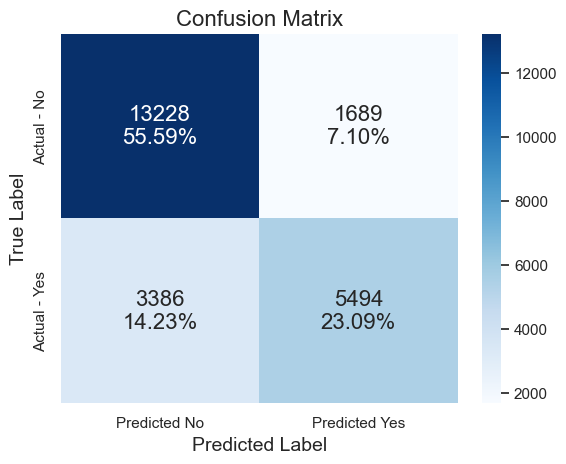

In [180]:
# Now you can call make_confusion_matrix
make_confusion_matrix(log_reg, X_test,y_test)

<br/>
<font color="darkblue" size="5">Decision Tree Base Model</font>


Training Metrics:
Accuracy: 0.9948312812539396
Precision: 0.9905953456845911
Recall: 0.9954873133904751
F1 Score: 0.9930353047761955

Test Metrics:
Accuracy: 0.8189687775770055
Precision: 0.7554189944134079
Recall: 0.7613738738738739
F1 Score: 0.7583847448121144


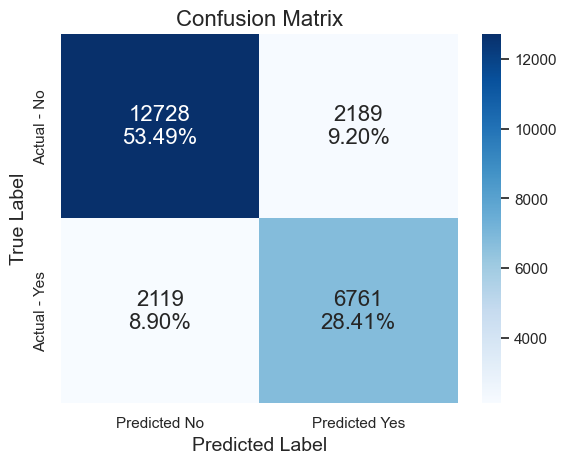

In [149]:
# Initialize Decision Tree Classifier
from sklearn import metrics
dt_classifier = DecisionTreeClassifier(random_state=42)

# Fit the classifier to the training data
dt_classifier.fit(X_train, y_train)

# Make predictions on the training and test data
y_train_pred = dt_classifier.predict(X_train)
y_test_pred = dt_classifier.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)

# Now you can call make_confusion_matrix
make_confusion_matrix(dt_classifier, X_test,y_test)

<br/>
<font color="darkblue" size="5">Visualize Base decision tree </font>

In [151]:
# Visualize decision tree
feature_names = X.columns


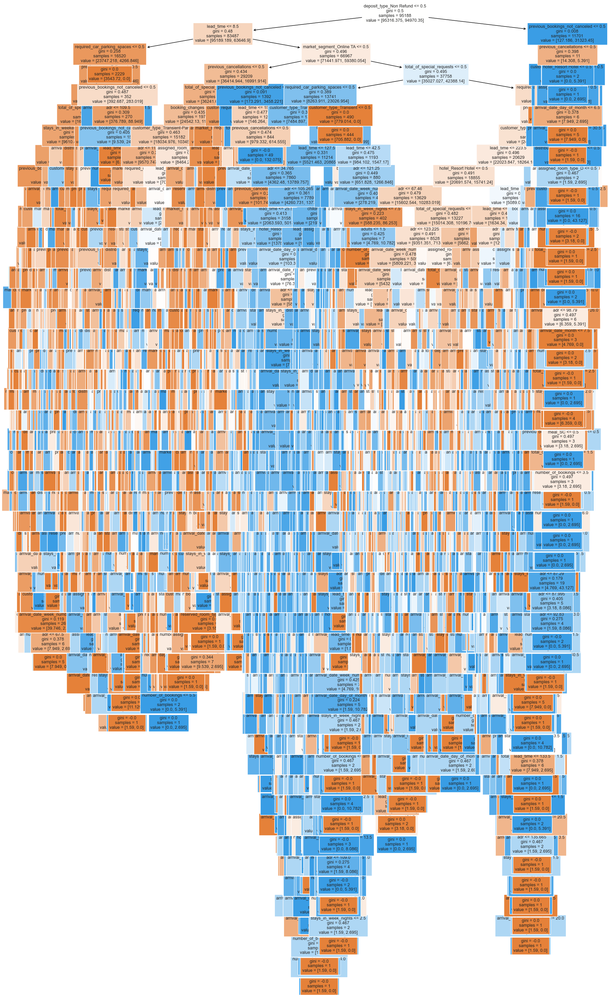

In [156]:
# Visualize decision tree
plt.figure(figsize=(20, 38))
out = plot_tree(dt_classifier, feature_names=list(X_train.columns), filled=True, fontsize=9, node_ids=False, class_names=None)

# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_linewidth(1)
        arrow.set_edgecolor('black')

plt.show()

<br/>
<font color="darkblue" size="5">Decision Tree with Hyper Parameter Tunning </font>

Best Parameters: {'splitter': 'best', 'min_samples_split': 5, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'max_depth': 14, 'criterion': 'gini'}
Training Metrics:
Accuracy: 0.8038303147455561
Precision: 0.7992699410893057
Recall: 0.6276607821990123
F1 Score: 0.7031461138578446

Test Metrics:
Accuracy: 0.7985880573181493
Precision: 0.7968046477850399
Recall: 0.6177927927927928
F1 Score: 0.6959720900729464


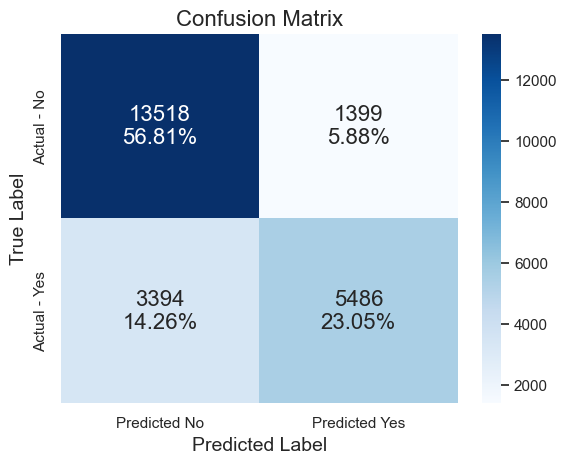

In [165]:
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameters and their ranges for tuning
parameters = {
    "max_depth": np.arange(5, 15),  # Adjusted the range for maximum depth
    "criterion": ["gini", "entropy"],
    "splitter": ["best", "random"],
    "min_samples_split": np.arange(2, 15),  # Adjusted the range for minimum samples split
    "min_samples_leaf": np.arange(1, 10),
    "max_features": ['sqrt', 'log2']
}

# Initialize Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(dt_classifier, parameters, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train, y_train)

# Get the best estimator
best_dt_classifier = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_dt_classifier.predict(X_train)
y_test_pred = best_dt_classifier.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)
# Now you can call make_confusion_matrix
make_confusion_matrix(best_dt_classifier, X_test,y_test)

<br/>
<font color="darkblue" size="5">Visualize Decision Tree After Prepruning </font>

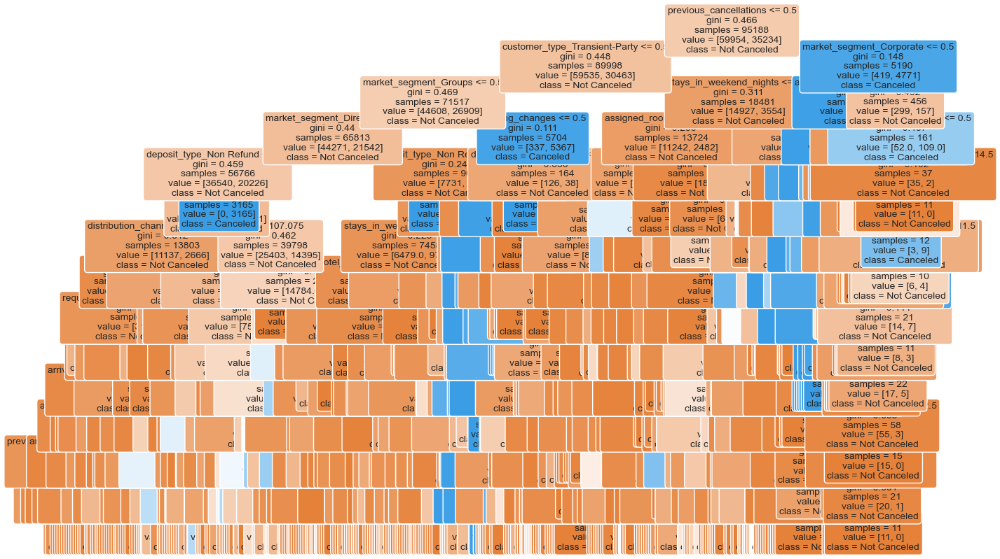

In [166]:
# Visualize decision tree
from sklearn.tree import DecisionTreeClassifier, plot_tree
plt.figure(figsize=(15, 10))
plot_tree(best_dt_classifier, feature_names=list(X_train.columns), class_names=['Not Canceled', 'Canceled'], filled=True, rounded=True, fontsize=10)
plt.show()

<br/>
<font color="darkblue" size="5">Random Forest with Hyper Parameter Tunning </font>

Best Parameters: {'n_estimators': 15, 'min_samples_split': 2, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'max_depth': 9}
Training Metrics:
Accuracy: 0.8092091440097491
Precision: 0.9000421762969212
Recall: 0.5450984844184594
F1 Score: 0.6789811394127941

Test Metrics:
Accuracy: 0.8065722570071858
Precision: 0.904635761589404
Recall: 0.5384009009009009
F1 Score: 0.675044122837981


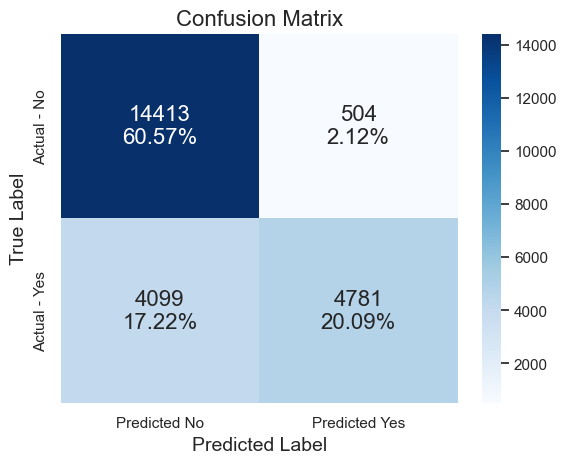

In [169]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameters and their ranges for tuning
parameters = {
    'n_estimators': [5, 7, 15],  # Number of trees in the forest
    'max_depth': np.arange(1, 10),  # Maximum depth of the tree
    'min_samples_split': np.arange(2, 20),  # Minimum number of samples required to split an internal node
    'min_samples_leaf': np.arange(1, 20),  # Minimum number of samples required to be at a leaf node
    'max_features': ['sqrt', 'log2']  # Number of features to consider when looking for the best split
}

# Initialize Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Perform RandomizedSearchCV
random_search = RandomizedSearchCV(rf_classifier, parameters, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train, y_train)

# Get the best estimator
best_rf_classifier = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_rf_classifier.predict(X_train)
y_test_pred = best_rf_classifier.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)

# Make confusion matrix for the best Decision Tree Classifier
make_confusion_matrix(best_rf_classifier,X_test,y_test)

<br/>
<font color="darkblue" size="5">Bagging with Hyperparameter Tunning </font>

Best Parameters: {'n_estimators': 10, 'max_samples': 1.0, 'max_features': 1.0}
Training Metrics:
Accuracy: 0.9849981090053368
Precision: 0.9910522340363721
Recall: 0.9682125219957995
F1 Score: 0.9794992534742162

Test Metrics:
Accuracy: 0.8514098415766693
Precision: 0.8485520480041743
Recall: 0.732545045045045
F1 Score: 0.7862927595793545


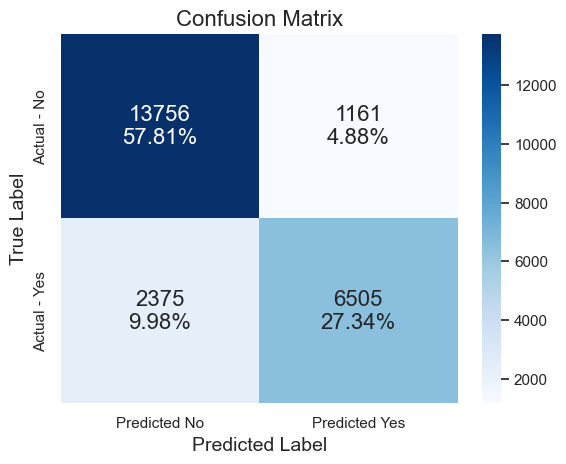

In [171]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Initialize base estimator (Decision Tree)
base_estimator = DecisionTreeClassifier(random_state=1)

# Define the hyperparameters and their ranges for tuning
parameters = {
    'n_estimators': [5, 10],  # Number of trees in the forest
    'max_samples': [0.5, 1.0],  # Maximum number of samples to draw from X to train each base estimator
    'max_features': [0.5, 1.0]  # Maximum number of features to consider when looking for the best split
}

# Initialize Bagging Classifier
bagging_classifier = BaggingClassifier(random_state=42)

# Perform RandomizedSearchCV with fewer iterations
random_search = RandomizedSearchCV(bagging_classifier, parameters, n_iter=5, cv=5, random_state=42)
random_search.fit(X_train, y_train)

# Get the best estimator
best_bagging_classifier = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_bagging_classifier.predict(X_train)
y_test_pred = best_bagging_classifier.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)


# Make confusion matrix for the best Decision Tree Classifier
make_confusion_matrix(best_bagging_classifier,X_test, y_test)

<br/>
<font color="darkblue" size="5">Ada Boosting with Hyperparameter Tunning </font>

Best Parameters: {'n_estimators': 15, 'learning_rate': 0.5}
Training Metrics:
Accuracy: 0.8130646720174812
Precision: 0.8576702214930271
Recall: 0.5934608616677073
F1 Score: 0.7015130674002751

Test Metrics:
Accuracy: 0.8114888431314872
Precision: 0.8653142667110076
Recall: 0.586036036036036
F1 Score: 0.6988048878743118


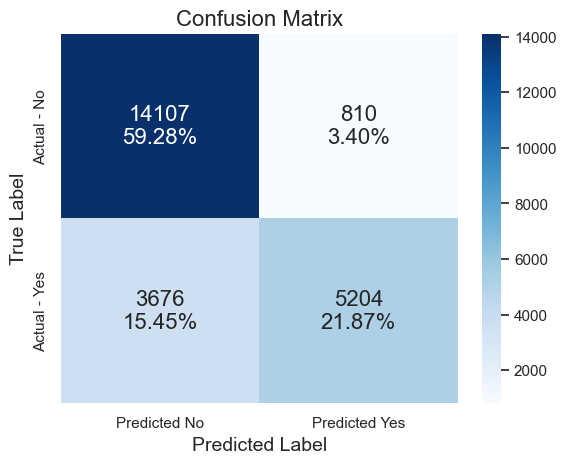

In [173]:
from sklearn.ensemble import AdaBoostClassifier

# Initialize AdaBoost Classifier with hyperparameter tuning parameters
ab_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
parameter_grid = {
    'n_estimators': np.arange(10, 50, 5),  # Number of boosting stages to be used in the boosting process
    'learning_rate': [1, 0.1, 0.5, 0.01]  # Weight applied to each classifier at each boosting iteration
}

# Use RandomizedSearchCV to find the best parameters
random_search = RandomizedSearchCV(ab_tuned, parameter_grid, scoring='recall', cv=5, n_iter=5, random_state=42)
random_search.fit(X_train, y_train)

# Get the best estimator
best_ab_tuned = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_ab_tuned.predict(X_train)
y_test_pred = best_ab_tuned.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred)
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

# Print evaluation metrics
print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)

# Make confusion matrix for the best Decision Tree Classifier
make_confusion_matrix(best_ab_tuned,X_test, y_test)

<br/>
<font color="darkblue" size="5">Gradient Boosting with Hyperparameter Tunning </font>

Best Parameters: {'n_estimators': 40, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_depth': 5, 'learning_rate': 0.3}
Training Metrics:
Accuracy: 0.8349371769550784
Precision: 0.8379379995101105
Recall: 0.6617187943463699
F1 Score: 0.7479708703602708

Test Metrics:
Accuracy: 0.8303987897634155
Precision: 0.8340963232237637
Recall: 0.6518018018018018
F1 Score: 0.7414809121188829


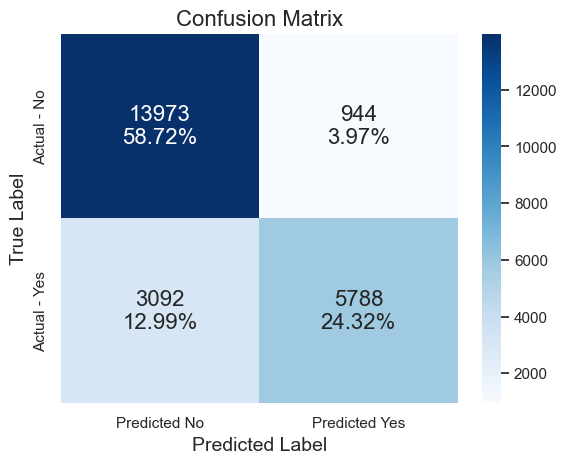

In [174]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting Classifier with hyperparameter tuning parameters
gb_tuned = GradientBoostingClassifier(random_state=1)

# Grid of parameters to choose from

parameter_grid = {
    'n_estimators': [20, 30, 40],  # Number of boosting stages to be used in the boosting process
    'learning_rate': [0.1, 0.3, 0.5],  # Weight applied to each classifier at each boosting iteration
    'max_depth': [3, 4, 5],  # Maximum depth of each tree in the ensemble
    'min_samples_split': [2, 3, 4],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 3]  # Minimum number of samples required to be at a leaf node
}

# Use RandomizedSearchCV to find the best parameters
random_search = RandomizedSearchCV(gb_tuned, parameter_grid, scoring='recall', cv=5, n_iter=3, random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best estimator
best_gb_tuned = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_gb_tuned.predict(X_train)
y_test_pred = best_gb_tuned.predict(X_test)

# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred, average='weighted')  # Changed to 'weighted'
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred, average='weighted')  # Changed to 'weighted'
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

# Print evaluation metrics
print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)

# Make confusion matrix for the best Decision Tree Classifier
make_confusion_matrix(best_gb_tuned,X_test,y_test)

<br/>
<font color="darkblue" size="5">XG Boosting with Hyperparameter Tunning </font>

Best Parameters: {'subsample': 0.8, 'scale_pos_weight': 11, 'n_estimators': 150, 'max_depth': 6, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 0.7, 'colsample_bylevel': 0.6}
Training Metrics:
Accuracy: 0.6781632138504854
Precision: 0.8204005402880082
Recall: 0.9897258330022137
F1 Score: 0.6948066826726705

Test Metrics:
Accuracy: 0.6625625078791444
Precision: 0.8006302730957582
Recall: 0.9700450450450451
F1 Score: 0.6820809248554913


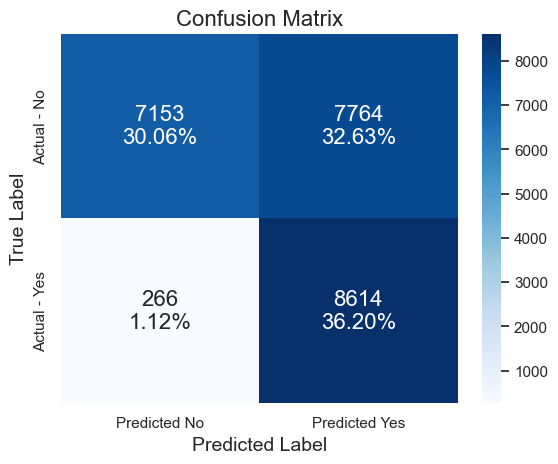

In [175]:
# Initialize XGBoost Classifier with hyperparameter tuning parameters
from xgboost import XGBClassifier
xgb_tuned = XGBClassifier(random_state=1)

# Grid of parameters to choose from
parameter_grid = {
    'n_estimators': [150, 175, 200, 225, 250],  # Adjust the number of trees
    'learning_rate': [0.1, 0.15, 0.2, 0.25],  # Adjust the learning rate
    'subsample': [0.6, 0.65, 0.7, 0.75, 0.8],  # Adjust the subsample ratio
    'gamma': [0, 0.1, 0.2, 0.3],  # Adjust gamma
    'colsample_bytree': [0.7, 0.75, 0.8, 0.85],  # Adjust colsample_bytree
    'colsample_bylevel': [0.6, 0.65, 0.7, 0.75],  # Adjust colsample_bylevel
    'max_depth': [6, 7, 8],  # Adjust max_depth
    'scale_pos_weight': [8, 9, 10, 11, 12]  # Adjust scale_pos_weight
}

# Use RandomizedSearchCV to find the best parameters
random_search = RandomizedSearchCV(xgb_tuned, parameter_grid, scoring='recall', cv=5, n_iter=20, random_state=42, n_jobs=-1)
random_search.fit(X_train, y_train)

# Get the best estimator
best_xgb_tuned = random_search.best_estimator_

# Make predictions on the training and test data
y_train_pred = best_xgb_tuned.predict(X_train)
y_test_pred = best_xgb_tuned.predict(X_test)
u
# Calculate evaluation metrics for the training data
accuracy_train = accuracy_score(y_train, y_train_pred)
precision_train = precision_score(y_train, y_train_pred, average='weighted')
recall_train = recall_score(y_train, y_train_pred)
f1_train = f1_score(y_train, y_train_pred)

# Calculate evaluation metrics for the test data
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred, average='weighted')
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)

# Print evaluation metrics
print("Best Parameters:", random_search.best_params_)
print("Training Metrics:")
print("Accuracy:", accuracy_train)
print("Precision:", precision_train)
print("Recall:", recall_train)
print("F1 Score:", f1_train)
print()
print("Test Metrics:")
print("Accuracy:", accuracy_test)
print("Precision:", precision_test)
print("Recall:", recall_test)
print("F1 Score:", f1_test)

# Make confusion matrix for the best Decision Tree Classifier
make_confusion_matrix(best_xgb_tuned,X_test, y_test)

<br/>
<font color="darkblue" size="5">XG Feature Importance </font>

In [177]:
# Get feature importances
feature_importances = best_xgb_tuned.feature_importances_

# Create a DataFrame to display feature importances
importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Print feature importances
print("Feature Importance:")
print(importance_df)

Feature Importance:
                           Feature  Importance
52         deposit_type_Non Refund    0.259175
15     required_car_parking_spaces    0.240267
10          previous_cancellations    0.057191
28        market_segment_Online TA    0.042273
46            reserved_room_type_D    0.034117
16       total_of_special_requests    0.028743
56   customer_type_Transient-Party    0.021780
0                        lead_time    0.019689
26           market_segment_Groups    0.016119
55         customer_type_Transient    0.014583
12                 booking_changes    0.013872
36            assigned_room_type_D    0.012862
27    market_segment_Offline TA/TO    0.012275
41            assigned_room_type_I    0.011884
34            assigned_room_type_B    0.009822
18              hotel_Resort Hotel    0.009768
44            reserved_room_type_B    0.009693
47            reserved_room_type_E    0.007638
35            assigned_room_type_C    0.007636
32      distribution_channel_TA/TO    0.

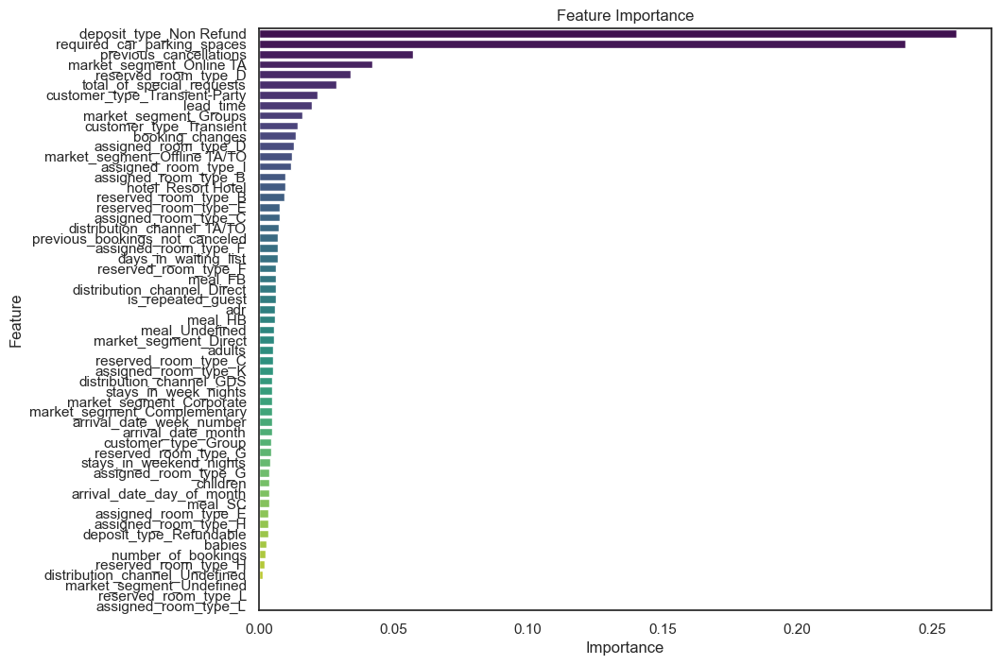

In [178]:
# Assuming 'Feature' and 'Importance' are the correct column names in your DataFrame
feature_names = importance_df['Feature']
importance_values = importance_df['Importance']

# Choose a color palette with distinct colors
color_palette = sns.color_palette("viridis", len(feature_names))

# Plotting
plt.figure(figsize=(10, 8))
sns.barplot(x=importance_values, y=feature_names, palette=color_palette)
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')

plt.show()

In [179]:
# Define the data for each classifier
data = {
    "Classifier": ["Logistic Regression", "Decision Tree", "Decision Tree (Pre-Pruning)", "Random Forest",
                   "Bagging Classifier", "AdaBoost Classifier", "Gradient Boost Classifier", "XGBoost Classifier"],
    "Accuracy Train": [0.7875, 0.81897, 0.80383, 0.8092, 0.85141, 0.81149, 0.8304, 0.67816],
    "Accuracy Test": [0.78674, 0.79859, 0.79859, 0.80657, 0.85141, 0.81149, 0.8304, 0.66256],
    "Precision Train": [0.76486, 0.79680, 0.79927, 0.90004, 0.84855, 0.86531, 0.83410, 0.82040],
    "Precision Test": [0.76486, 0.79680, 0.79927, 0.90004, 0.84855, 0.86531, 0.83410, 0.80063],
    "Recall Train": [0.61886, 0.61779, 0.62766, 0.54510, 0.73255, 0.58604, 0.65180, 0.98972],
    "Recall Test": [0.61869, 0.61779, 0.61779, 0.53840, 0.73255, 0.58604, 0.65180, 0.97005],
    "F1 Score Train": [0.68406, 0.69597, 0.70315, 0.67898, 0.78629, 0.69880, 0.74148, 0.69481],
    "F1 Score Test": [0.68406, 0.69597, 0.69597, 0.67504, 0.78629, 0.69880, 0.74148, 0.68208]
}

# Create DataFrame
df_summary = pd.DataFrame(data)

# Set Classifier column as index
df_summary.set_index("Classifier", inplace=True)

# Display the DataFrame
df_summary

,Accuracy Train,Accuracy Test,Precision Train,Precision Test,Recall Train,Recall Test,F1 Score Train,F1 Score Test
Classifier,,,,,,,,
Logistic Regression,0.78750,0.78674,0.76486,0.76486,0.61886,0.61869,0.68406,0.68406
Decision Tree,0.81897,0.79859,0.79680,0.79680,0.61779,0.61779,0.69597,0.69597
Decision Tree (Pre-Pruning),0.80383,0.79859,0.79927,0.79927,0.62766,0.61779,0.70315,0.69597
Random Forest,0.80920,0.80657,0.90004,0.90004,0.54510,0.53840,0.67898,0.67504
Bagging Classifier,0.85141,0.85141,0.84855,0.84855,0.73255,0.73255,0.78629,0.78629
AdaBoost Classifier,0.81149,0.81149,0.86531,0.86531,0.58604,0.58604,0.69880,0.69880
Gradient Boost Classifier,0.83040,0.83040,0.83410,0.83410,0.65180,0.65180,0.74148,0.74148
XGBoost Classifier,0.67816,0.66256,0.82040,0.80063,0.98972,0.97005,0.69481,0.68208


**Business Conclusion**

**Model Choice:**

XGBoost Classifier is chosen for hotel booking cancellation prediction due to its superior overall performance.
The XGBoost model has found that features related to the deposit type, previous cancellations, car parking requirements, market segment,Lead time and customer type are the most important features for predicting cancellations. This suggests that the financial and logistical aspects, as well as the booking channel and customer category, are particularly important in determining whether a booking will be canceled.

**Business Focus:** Minimize false positives to prevent revenue loss, accurately identify cancellations for smooth operations.



**Keep Getting Better:** Always check and improve using new data and what the business needs to stay accurate.